Multiplexed smFISH on mouse cortex

# Imports

In [1816]:
import loompy
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import pickle
from collections import Counter
import scipy
from mpl_toolkits.axes_grid1 import make_axes_locatable
import networkx 
from networkx.algorithms.components.connected import connected_components
import itertools
from matplotlib.ticker import FuncFormatter
import matplotlib
import seaborn as sns

plt.rcParams.update({'figure.max_open_warning': 150})

%matplotlib notebook

# Exports

In [1692]:
pickle.dump(df_fish_totmol_clean, open( "df_fish_totmol_clean.p", "wb" ))
pickle.dump(coord_df, open( "Cell_coordinates.p", "wb" ))
pickle.dump(labels_a, open( "labels_a_df_fish_totmol_clean.p", "wb" ))
pickle.dump(cell_labels, open( "Cell_labels_df_fish_totmol_clean.p", "wb" ))

# Import Data

## smFISH

In [6]:
file_name = '/home/lars/storage/Documents/Cortex_FISH/CountsV1-1.loom'
ds = loompy.connect(file_name)

#Cell size in dictionary. convert pixels to square um (pixel size = 0.065um)
cell_size = dict(zip(ds.CellID, (np.sqrt(ds.CellArea)*0.065)**2))

In [9]:
#Open object properties
obj_prop = pickle.load(open("ObjProp_dict.pkl", 'rb'))

#Load cell ID and XY coordinates into a list
coord_list = []
for i in obj_prop:
    coord_list.append([i, obj_prop[i]['obj_centroid'][0], obj_prop[i]['obj_centroid'][1]])
    
#Place cell ID and X and Y coordinates into dataframe
coord_df = pd.DataFrame(coord_list, columns=['Cell_ID', 'X', 'Y']).set_index('Cell_ID').T
coord_df = coord_df.loc[:,df_fish.columns]

In [1744]:
def loompy2data(filename, cutoff_low, cutoff_high, molecules_low):
    """
    Loom file to Panda's dataframe. Perform size and count selection on cells
    Input:
    `filename`(str): Name and path tot the Loom file
    `cutoff_low`(flt): Minimal cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `cutoff_high`(flt): Max cell size (in number of pixels, square um = (np.sqrt(pixels)*0.065)**2
    `molecules_low`(int): Minimal number of molecules
    Returns:
    Panda's dataframe with cells that passed the criteria. df has cell label as column name. 
    Some gene names are corrected
    Metadata is discarded. 
    
    """
    #Read loom file and import to Pandas df
    ds = loompy.connect(filename)
    df=pd.DataFrame(data=ds[:,:], columns=ds.col_attrs['CellID'], index=ds.row_attrs['genes']).astype(int)
    
    #Filter cell size
    for i, j in enumerate(ds.col_attrs['CellID']):
        if ds.col_attrs['CellArea'][i] < cutoff_low or ds.col_attrs['CellArea'][i] > cutoff_high:
            del df[j]
    
    #Filter total molecule count
    for i, j in enumerate(ds.col_attrs['CellID']):
        try: #not all 'CellID' are still present
            if df[j].sum() < molecules_low:
                del df[j]
        except Exception:
            pass
        
    #Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
    df= df.rename({'Hybridization11_Tmem6': 'Hybridization11_Tmem2', 'Hybridization12_Kcnip': 'Hybridization12_Kcnip2'})
        
    #Filter bad hybridiztion4 (out of focus imaging) and repeat Tbr1
    bad_data = ['Hybridization4_Cnr1', 'Hybridization4_Plp1', 'Hybridization4_Vtn', 'Hybridization11_Tbr1',
                'Hybridization9_Lum', 'Hybridization5_Klk6']
    for i in bad_data:
        df.drop(i, inplace=True)
    
    
    print('Selected cells with  {}>size<{} and a minimum molecule count of {} molecules'.format(cutoff_low, cutoff_high, molecules_low))
    print('Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2')
    return df

    
df_fish = loompy2data(file_name, 2000, 60000, 20)

gene_sort_fish = ['Hybridization2_Gad2', 'Hybridization12_Slc32a1', 'Hybridization10_Crhbp',  'Hybridization13_Cnr1', 'Hybridization6_Vip', 'Hybridization5_Cpne5', 'Hybridization8_Pthlh',  'Hybridization10_Crh', 
'Hybridization1_Tbr1', 'Hybridization9_Lamp5', 'Hybridization7_Rorb', 'Hybridization11_Syt6','Hybridization12_Kcnip2',
'Hybridization1_Aldoc', 'Hybridization2_Gfap', 'Hybridization8_Serpinf1', 'Hybridization3_Mfge8',
 'Hybridization7_Sox10', 'Hybridization13_Plp1', 'Hybridization8_Pdgfra', 'Hybridization6_Bmp4','Hybridization6_Itpr2',
                  'Hybridization11_Tmem2', 'Hybridization7_Ctps','Hybridization9_Anln',
 'Hybridization3_Mrc1','Hybridization3_Hexb', 
 'Hybridization13_Ttr',
 'Hybridization1_Foxj1',
 'Hybridization12_Vtn',
 'Hybridization2_Flt1',
 'Hybridization10_Apln',
 'Hybridization5_Acta2'
 ]

gene_sort = ['Gad2', 'Slc32a1', 'Crhbp',  'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 'Kcnip2',
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Anln',   
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2'] 

gene_sort_full = ['Gad2', 'Slc32a1', 'Crhbp',  'Cnr1', 'Vip', 'Cpne5', 'Pthlh', 'Crh',             
             'Tbr1', 'Lamp5', 'Rorb', 'Syt6', 'Kcnip2',
             'Aldoc', 'Gfap', 'Serpinf1', 'Mfge8', 
             'Sox10', 'Plp1', 'Pdgfra', 'Bmp4', 'Itpr2', 'Tmem2',  'Ctps',  'Anln', 'Klk6',  
             'Mrc1', 'Hexb', 
             'Ttr', 
             'Foxj1', 
             'Vtn', 'Flt1', 'Apln', 'Acta2', 'Lum']

df_fish = df_fish.loc[gene_sort_fish]


#Exclude the cells in the bleached area
coord_df = coord_df.loc[:, coord_df.loc['X'] < 25000]
#include_cells = coord_df.loc[:, coord_df.loc['X'] < 25000].columns.tolist()
df_fish = df_fish.loc[:, coord_df.columns]
print('Excluded cells from the bleached area')

print('\nFinal shape: {} genes, {} cells'.format(df_fish.shape[0], df_fish.shape[1]))

Selected cells with  2000>size<60000 and a minimum molecule count of 20 molecules
Change incorrect names Tmem6-->Tmem2 and Kcnip-->Kcnip2
Excluded cells from the bleached area

Final shape: 33 genes, 5208 cells


In [1617]:
# normalize data by total number of molecules per cell and per gene.
df_fish_totmol = df_fish.divide(df_fish.sum(axis=1), axis=0) * df_fish.shape[0] #Corrected for total molecules per gene
df_fish_totmol = df_fish_totmol.divide(df_fish_totmol.sum(axis=0), axis=1) * df_fish.shape[1] #Corrected for the total per cell
#Non needed in this dataset but for future use:
df_fish_totmol = df_fish_totmol.fillna(0)


df_fish_totmol

,1124,2325,2400,241,6248,5992,275,2573,330,1149,...,1217,2808,5162,532,3607,3251,2757,1228,1234,4653
Hybridization2_Gad2,53.784267,116.093907,59.047534,70.706421,548.995818,76.153191,134.570315,15.623643,32.582296,112.453076,...,109.521545,0.000000,44.268444,117.853948,89.666315,33.159412,40.690287,51.707916,167.089203,186.001151
Hybridization12_Slc32a1,42.570987,80.403683,109.052848,78.351146,514.760089,0.000000,53.257127,0.000000,90.262674,0.000000,...,0.000000,27.505346,0.000000,54.415095,27.600269,0.000000,225.448452,0.000000,0.000000,0.000000
Hybridization10_Crhbp,83.870682,0.000000,107.424533,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,153.438488,...,0.000000,54.189303,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Hybridization13_Cnr1,19.051987,71.966849,97.609831,490.907807,1172.807572,566.490216,286.012842,271.183581,201.978319,69.709891,...,0.000000,98.476737,164.652593,146.115805,617.603682,41.111174,151.343952,0.000000,0.000000,251.569075
Hybridization6_Vip,289.991224,84.262381,114.286464,164.222677,735.633035,221.091676,167.439058,90.718650,47.297260,108.826428,...,0.000000,576.507403,0.000000,627.292162,57.849698,240.675078,413.469129,300.241912,161.700522,49.091606
Hybridization5_Cpne5,0.000000,489.380594,82.969377,59.610967,35.603525,0.000000,162.075937,592.737115,137.346946,0.000000,...,0.000000,0.000000,279.912850,0.000000,419.975668,0.000000,0.000000,0.000000,0.000000,1140.460497
Hybridization8_Pthlh,152.647395,0.000000,0.000000,0.000000,671.193674,0.000000,190.964841,155.197415,0.000000,0.000000,...,0.000000,98.626312,0.000000,0.000000,98.966680,164.694469,0.000000,0.000000,0.000000,0.000000
Hybridization10_Crh,111.760355,0.000000,286.293225,0.000000,184.279701,0.000000,838.886187,113.627345,0.000000,136.307783,...,0.000000,72.208973,160.977371,142.854344,72.458173,120.580586,0.000000,0.000000,405.067778,0.000000
Hybridization1_Tbr1,81.142869,259.353380,447.701277,137.854163,48.028996,371.183912,218.639716,304.609419,66.171578,22.838161,...,88.971181,96.788028,1024.917509,319.133704,210.431113,107.749833,82.638144,0.000000,211.146411,68.681970
Hybridization9_Lamp5,20.040873,479.447672,436.374002,774.582311,0.000000,33.105205,434.573013,298.843046,361.185288,0.000000,...,23.805524,4.316172,38.488629,8.538883,727.619411,36.037530,0.000000,0.000000,8.070753,661.566703


## Single Cell

In [1674]:
# Import the Single Cell Cortex data into a data frame (Zeisel 2015)
df_sc_cort = pd.read_csv('/home/lars/storage/Documents/Single_Cell/Single_Cell_Cortex_Data/expression_mRNA_17-Aug-2014.txt', 
                         sep="\t", index_col=0, low_memory=False)
#used Low_memory=False, because the df is made up of mixed types in the rows. (normaly pandas expects different parameters in the columns)

# Remove all the bad cells (Cells with the label '(none)'
    #This removes 189 bad cells
df_sc_cort = df_sc_cort.loc[:, [i for i in df_sc_cort.columns if df_sc_cort.iloc[8,df_sc_cort.columns.get_loc(i)] != '(none)']].copy()

# Put all cell labels in a dictionary
sc_cor_cell_label_1 = df_sc_cort.iloc[7,1:].to_dict()
sc_cor_cell_label_2 = df_sc_cort.iloc[8,1:].to_dict()

# Get rid of the meta data
df_sc_cort = df_sc_cort.iloc[10:,1:]

#Make a copy with all the genes
df_sc_cort_all_genes = df_sc_cort.copy()
df_sc_cort_all_genes = df_sc_cort_all_genes.astype(int)
# 
df_sc_cort = df_sc_cort.loc[gene_sort,:]
df_sc_cort = df_sc_cort.astype(int)
print(df_sc_cort.shape)

(33, 2816)


In [1648]:
#transform the data in the same way as the FISH data
df_sc_totmol = df_sc_cort.divide(df_sc_cort.sum(axis=1), axis=0) * df_sc_cort.shape[0] #Corrected for total molecules per gene
df_sc_totmol = df_sc_totmol.divide(df_sc_totmol.sum(axis=0), axis=1)# * df_sc_cort.shape[1] #Corrected for the total per cell
df_sc_totmol = df_sc_totmol.fillna(0)

df_sc_all_totmol = df_sc_cort_all_genes.divide(df_sc_cort_all_genes.sum(axis=1), axis=0) * df_sc_cort_all_genes.shape[0] #Corrected for total molecules per gene
df_sc_all_totmol = df_sc_all_totmol.fillna(0)
df_sc_all_totmol = df_sc_all_totmol.divide(df_sc_all_totmol.sum(axis=0), axis=1) * df_sc_cort_all_genes.shape[1] #Corrected for the total per cell
df_sc_all_totmol = df_sc_all_totmol.fillna(0)

# Marker selection

In [1745]:
#Load the data set with the cortex and oligo paper cells
df_sc_cort_olig = pd.read_pickle('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/df_cortex_olig.pkl')
df_sc_cort_olig = df_sc_cort_olig.loc[gene_sort_full,:]

#Load Cell label dictionary
sc_cort_olig_label = pickle.load(open('/home/lars/storage/Documents/Single_Cell/Single_Cell_All_2016/label_cortex_olig.pkl', "rb" ) )
df_sc_cort_olig.head(5)

,sscortex,sscortex.1,sscortex.2,sscortex.3,sscortex.4,sscortex.5,sscortex.6,ca1hippocampus,sscortex.7,sscortex.8,...,C1-1772078-018-A06,C1-1772099-001-A01,C1-1772089-205-A10,C1-1772089-205-F02,C1-1772117-028-B06,C1-1772089-205-B09,C1-1772063-074-D10,C1-1772089-202-G07,C1-1772089-202-B06,C1-1772117-055-D11
Gad2,23,9,14,19,6,35,79,51,52,91,...,0,1,0,0,0,0,0,0,0,0
Slc32a1,7,12,13,8,13,3,12,9,6,6,...,0,0,0,0,0,0,0,0,0,0
Crhbp,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0
Cnr1,20,12,122,82,7,40,38,80,10,62,...,0,0,0,0,0,0,0,0,0,0
Vip,416,224,286,359,221,54,531,0,296,151,...,0,0,0,0,0,0,0,0,0,0


In [1981]:
df_CO_totmol = df_sc_cort_olig.divide(df_sc_cort_olig.sum(axis=1), axis=0) * df_sc_cort_olig.shape[0]
df_CO_totmol = df_CO_totmol.divide(df_CO_totmol.sum(axis=0), axis=1) * df_CO_totmol.shape[1]
df_CO_totmol = df_CO_totmol.fillna(0)

In [2022]:
np.unique(sc_CO_labels)

array(['Astro1', 'Astro2', 'CA1Pyr1', 'CA1Pyr2', 'CA1PyrInt', 'CA2Pyr2',
       'COP', 'Choroid', 'ClauPyr', 'Epend', 'Int1', 'Int10', 'Int11',
       'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'Int2', 'Int3', 'Int4',
       'Int5', 'Int6', 'Int7', 'Int8', 'Int9', 'MFOL1', 'MFOL2', 'MOL1',
       'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 'Mgl1', 'Mgl2', 'NFOL1',
       'NFOL2', 'OPC', 'PPR', 'Peric', 'Pvm1', 'Pvm2', 'S1PyrDL',
       'S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6', 'S1PyrL6b',
       'SubPyr', 'Vend1', 'Vend2', 'Vsmc'],
      dtype='<U9')

<IPython.core.display.Javascript object>


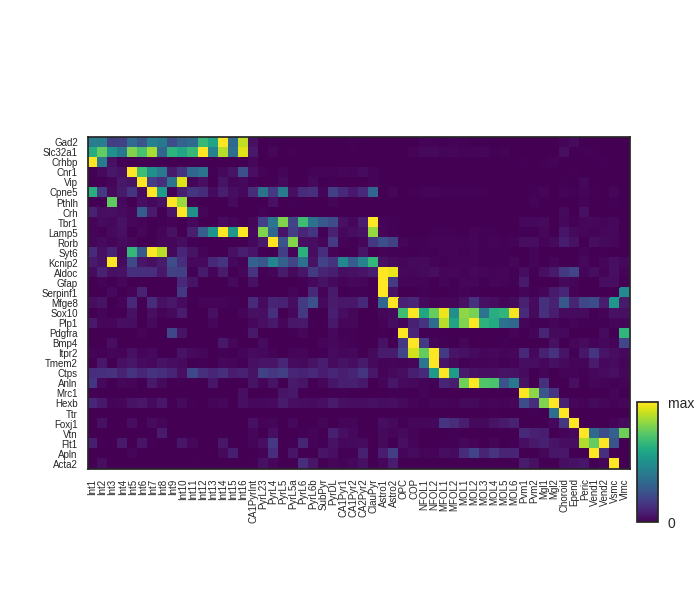

In [2089]:
#make list and array of cell type labels
sc_CO_labels = []
for i in df_sc_cort_olig.columns:
    sc_CO_labels.append(sc_cort_olig_label[i])
sc_CO_labels_a = np.array(sc_CO_labels)

#Make df with count averages per cluster
df_count_average_sc = pd.DataFrame(index=df_sc_cort_olig.index, columns=np.unique(sc_CO_labels_a))



for l in np.unique(sc_CO_labels_a):
    #filt = np.sort(sc_CO_labels) == l
    filt = sc_CO_labels_a == l
    mean = np.array(df_sc_cort_olig.loc[:,filt].T.mean())
    #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
    if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
        df_count_average_sc[l] = mean

#df_count_average_sc = df_count_average_sc.loc[gene_sort,:]
        
type_sort_sc_cort = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6', 'S1PyrL6b',
'SubPyr', 'S1PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA2Pyr2','ClauPyr',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'PPR']

type_sort_sc_cort_corrected = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'PyrL23', 'PyrL4', 'PyrL5', 'PyrL5a', 'PyrL6', 'PyrL6b',
'SubPyr', 'PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA2Pyr2','ClauPyr',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',

'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'Vlmc']

df_count_average_sc = df_count_average_sc.loc[gene_sort, type_sort_sc_cort]


fig, ax = plt.subplots(figsize=(7,6))
z = df_count_average_sc.values
z = z/np.percentile(z, 99, 1)[:,None]
im  = ax.pcolor(z,cmap='viridis', vmax=1)

y_pos = np.arange(len(df_count_average_sc.index))
x_pos = np.arange(len(df_count_average_sc.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected, rotation='vertical', fontsize=7) #df_count_average_sc.columns
ax.set_yticks(y_pos+0.5)
ax.set_yticklabels(df_count_average_sc.index, fontsize=7)
ax.invert_yaxis()

ax.set_aspect('equal')


cax = fig.add_axes([.91, 0.13, 0.03, 0.2])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', 'max'])


plt.savefig('Marker_selection.svg')

In [2090]:
for i in type_sort_sc_cort_corrected:
    print(i)

Int1
Int2
Int3
Int4
Int5
Int6
Int7
Int8
Int9
Int10
Int11
Int12
Int13
Int14
Int15
Int16
CA1PyrInt
PyrL23
PyrL4
PyrL5
PyrL5a
PyrL6
PyrL6b
SubPyr
PyrDL
CA1Pyr1
CA1Pyr2
CA2Pyr2
ClauPyr
Astro1
Astro2
OPC
COP
NFOL1
NFOL2
MFOL1
MFOL2
MOL1
MOL2
MOL3
MOL4
MOL5
MOL6
Pvm1
Pvm2
Mgl1
Mgl2
Choroid
Epend
Peric
Vend1
Vend2
Vsmc
Vlmc


# Gene expression FISH

<IPython.core.display.Javascript object>


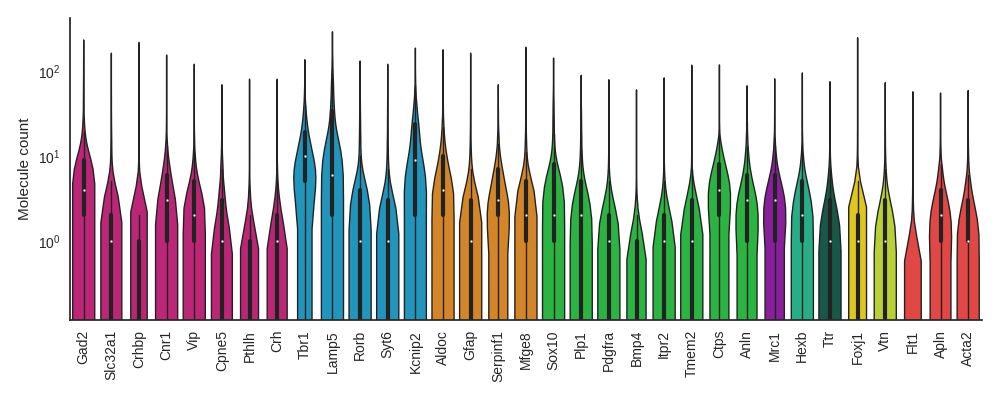

In [1832]:
plt.figure(figsize=(10,4))
data = [[df_fish.loc[i].values] for i in df_fish.index]
#data = [l[l != 0] for l in data]
gene_colors =   ['#d40d79', '#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79',
        '#07a2d5','#07a2d5','#07a2d5','#07a2d5','#07a2d5',
        '#f1880b','#f1880b','#f1880b','#f1880b',
        '#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33',
        '#950cae', '#11c48f',
        '#0c644a', '#ffde00',
        '#cbeb1c', '#fa2e2b', '#fa2e2b', '#fa2e2b']

#From: https://stackoverflow.com/questions/29643352/converting-hex-to-rgb-value-in-python
gene_colors_rgb = [list((int(c.lstrip('#')[i:i+2], 16)/255) for i in (0, 2 ,4)) for c in gene_colors]

sns.set_style('white')
sns.violinplot(data=data, palette=zz, bw=0.2, cut=0, linewidth=1, scale="width", spines='left')
sns.despine()
ax = plt.gca()
ax.set_yscale('log')
x_pos = np.arange(df_fish.shape[0])
ax.set_xticks(x_pos)
labels = [i.split('_')[1] for i in df_fish.index]
ax.set_xticklabels(labels, rotation='vertical', fontsize=10)
ax.set_ylabel('Molecule count')
plt.tight_layout()
plt.savefig('Count_distribution_smFISH.svg')

In [1833]:
for i in gene_sort:
    print(i)

Gad2
Slc32a1
Crhbp
Cnr1
Vip
Cpne5
Pthlh
Crh
Tbr1
Lamp5
Rorb
Syt6
Kcnip2
Aldoc
Gfap
Serpinf1
Mfge8
Sox10
Plp1
Pdgfra
Bmp4
Itpr2
Tmem2
Ctps
Anln
Mrc1
Hexb
Ttr
Foxj1
Vtn
Flt1
Apln
Acta2


# Comparison smFISH & Single Cell

## Counts

In [1421]:
#Zeros fish
print('In smFISH {}% of the values are a zero'.format(Counter(df_fish.values.flat)[0] / (df_fish.shape[0] *df_fish.shape[1]) * 100))

#Zeros single cell
print('In single cell RNA-seq {}% of the values are a zero'.format(Counter(df_sc_cort.values.flat)[0] / (df_sc_cort.shape[0] *df_sc_cort.shape[1]) * 100))

in smFISH 30.22389796583345% of the values is a zero
in single cell RNA-seq 82.45738636363636% of the values is a zero


In [1422]:
difference_sc_fish = np.zeros((len(gene_sort_fish),3))
for i, g in enumerate(gene_sort_fish):
    difference_sc_fish[i,0] = np.mean(df_fish.loc[g])
    difference_sc_fish[i,1] = np.mean(df_sc_cort.loc[g.split('_')[1]])
    difference_sc_fish[i,2] = (np.mean(df_fish.loc[g]) / np.mean(df_sc_cort.loc[g.split('_')[1]]))

<IPython.core.display.Javascript object>


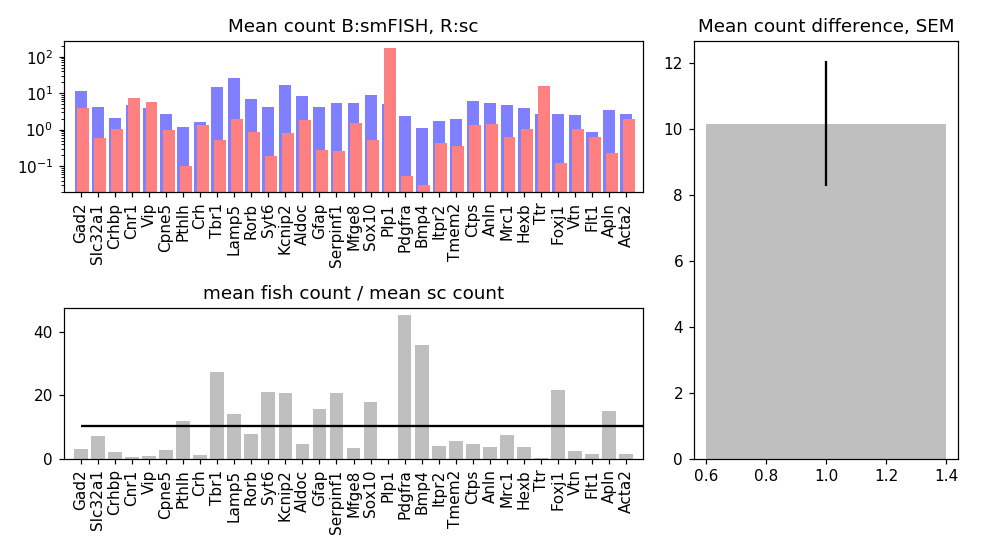

The mean count is on average 10.167147743730695 times higher for the smFISH compated to the single cell, with a SEM of 1.9017496524158242
Assumes unbiased cell sampling


In [1423]:
plt.figure(figsize=(9, 5))
ax1 = plt.subplot2grid((2,3), (0,0), rowspan=1, colspan=2)
x_pos = list(range(difference_sc_fish.shape[0]))
ax1.bar(x_pos, difference_sc_fish[:,0], color='b', alpha=0.5, linewidth=0, width=0.7)
ax1.bar([x+0.15 for x in x_pos], difference_sc_fish[:,1],  alpha=1, linewidth=0, width=0.7, color=[255/255,128/255,128/255])
ax1.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax1.set_xticklabels(gene_sort, rotation='vertical');
ax1.set_yscale("log")
ax1.set_xlim(-1, len(gene_sort))
ax1.set_title('Mean count B:smFISH, R:sc')

ax2 = plt.subplot2grid((2,3), (1,0), rowspan=1, colspan=2)
ax2.bar(x_pos, difference_sc_fish[:,2], color='grey', alpha=0.5)
ax2.set_xticks(np.arange(difference_sc_fish.shape[0])+0.0)
ax2.set_xticklabels(gene_sort, rotation='vertical');
ax2.set_title('mean fish count / mean sc count')
ax2.hlines(np.mean(difference_sc_fish[:,2]), 0, 35)
ax2.set_xlim(-1, len(gene_sort))

ax3 = plt.subplot2grid((2,3), (0,2), rowspan=2, colspan=1)
ax3.bar(1,np.mean(difference_sc_fish[:,2]), yerr = np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0]), color='grey', alpha=0.5, ecolor='black')
ax3.set_title('Mean count difference, SEM')
plt.tight_layout()

print('The mean count is on average {} times higher for the smFISH compated to the single cell, with a SEM of {}'.format(np.mean(difference_sc_fish[:,2]), np.std(difference_sc_fish[:,2])/np.sqrt(difference_sc_fish.shape[0])))
print('Assumes unbiased cell sampling')

<IPython.core.display.Javascript object>


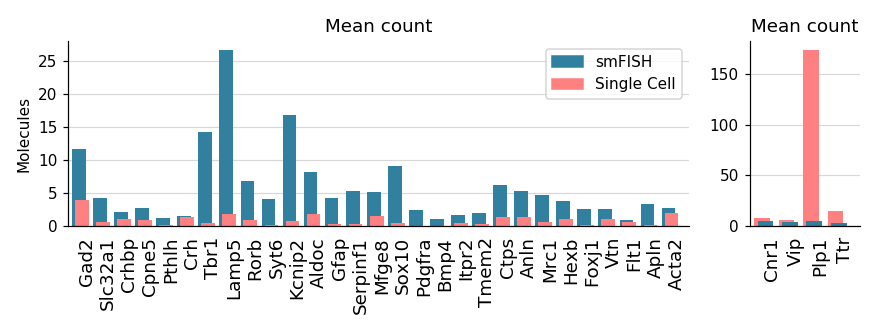

In [1440]:
difference_sc_fish = pd.DataFrame(data = np.zeros((len(gene_sort_fish),5)), 
                                  index=gene_sort_fish, columns=['mean_fish', 'f_std', 'mean_sc','s_std', 'f/s'])

for g in gene_sort_fish:
    difference_sc_fish.loc[g] = [np.mean(df_fish.loc[g]), np.std(df_fish.loc[g]),
                                 np.mean(df_sc_cort.loc[g.split('_')[1]]), np.std(df_sc_cort.loc[g.split('_')[1]]), 
                                 (np.mean(df_fish.loc[g]) / np.mean(df_sc_cort.loc[g.split('_')[1]]))]

fish_h =[]
sc_h = []
for n, i in enumerate(difference_sc_fish.index):
    if difference_sc_fish.iloc[n,4] > 1:
        fish_h.append(i)
    else:
        sc_h.append(i)

fig= plt.figure (figsize=(8,3))

ax1 = plt.subplot2grid((1,5), (0,0), rowspan=1, colspan=4)
x_pos = np.array(range(difference_sc_fish.loc[fish_h].shape[0]))
ax1.bar(x_pos+0.01, difference_sc_fish.loc[fish_h].iloc[:,0], alpha=1, linewidth=0, width=0.65, color='#3280a0')
ax1.bar(x_pos+0.15, difference_sc_fish.loc[fish_h].iloc[:,2],  alpha=1, linewidth=0, width=0.65, color=[255/255,128/255,128/255])
#ax1.set_yscale("log")
ax1.set_xticks(np.arange(len(gene_sort))+0.4)
genes = []
for i in difference_sc_fish.loc[fish_h].index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
ax1.set_xticklabels(genes, rotation='vertical', fontsize=12)
ax1.set_xlim(-0.5, len(genes))

#ax1.yaxis.set_major_formatter(FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax1.set_axisbelow(True)
ax1.yaxis.grid(color='gray', linestyle='solid', alpha=0.3)

ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
ax1.yaxis.set_ticks_position('left')
ax1.xaxis.set_ticks_position('none')
ax1.set_ylabel('Molecules')
ax1.set_title('Mean count')


ax2 = plt.subplot2grid((1,5), (0,4), rowspan=1, colspan=1)
x_pos = np.array(range(difference_sc_fish.loc[sc_h].shape[0]))
ax2.bar(x_pos+0.01, difference_sc_fish.loc[sc_h].iloc[:,2],  alpha=1, linewidth=0, width=0.65, color=[255/255,128/255,128/255])
ax2.bar(x_pos+0.15, difference_sc_fish.loc[sc_h].iloc[:,0], alpha=1, linewidth=0, width=0.65, color='#3280a0')

#ax1.set_yscale("log")
ax2.set_xticks(np.arange(len(gene_sort))+0.4)
genes = []
for i in difference_sc_fish.loc[sc_h].index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
ax2.set_xticklabels(genes, rotation='vertical', fontsize=12)
ax2.set_xlim(-0.5, len(genes))

#ax1.yaxis.set_major_formatter(FuncFormatter(lambda y,pos: ('{{:.{:1d}f}}'.format(int(np.maximum(-np.log10(y),0)))).format(y)))

ax2.set_axisbelow(True)
ax2.yaxis.grid(color='gray', linestyle='solid', alpha=0.3)

ax2.spines['top'].set_visible(False)
ax2.spines['right'].set_visible(False)
ax2.yaxis.set_ticks_position('left')
ax2.xaxis.set_ticks_position('none')
ax2.set_title('Mean count')

blue_patch = matplotlib.patches.Patch(color='#3280a0', label='smFISH')
red_patch = matplotlib.patches.Patch(color=[255/255,128/255,128/255], label='Single Cell')
plt.sca(ax1)
plt.legend(handles=[blue_patch, red_patch], loc=0)

plt.tight_layout()

#plt.savefig('Comparison_smFISH_sc.svg')

<IPython.core.display.Javascript object>


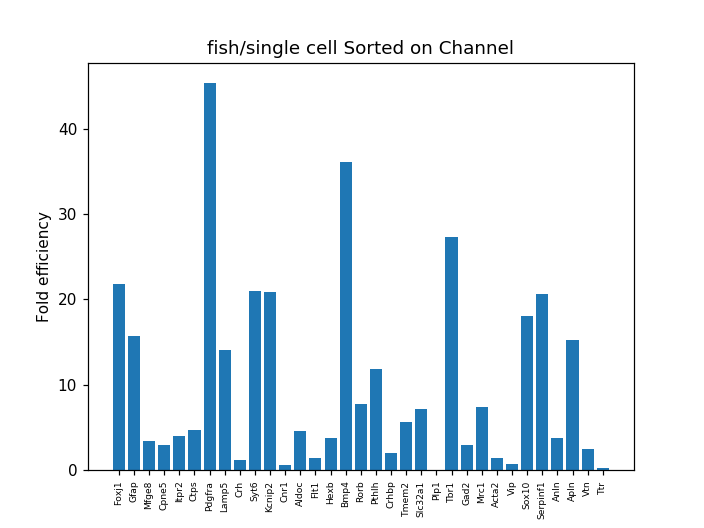

In [1500]:
plt.figure()

df = difference_sc_fish.loc[['Hybridization1_Foxj1','Hybridization2_Gfap','Hybridization3_Mfge8','Hybridization5_Cpne5', 
            'Hybridization6_Itpr2','Hybridization7_Ctps','Hybridization8_Pdgfra','Hybridization9_Lamp5','Hybridization10_Crh',
            'Hybridization11_Syt6','Hybridization12_Kcnip2','Hybridization13_Cnr1',
            'Hybridization1_Aldoc','Hybridization2_Flt1','Hybridization3_Hexb',
              'Hybridization6_Bmp4','Hybridization7_Rorb','Hybridization8_Pthlh','Hybridization10_Crhbp',
              'Hybridization11_Tmem2','Hybridization12_Slc32a1','Hybridization13_Plp1',
            'Hybridization1_Tbr1','Hybridization2_Gad2','Hybridization3_Mrc1','Hybridization5_Acta2',
            'Hybridization6_Vip','Hybridization7_Sox10','Hybridization8_Serpinf1','Hybridization9_Anln','Hybridization10_Apln',
            'Hybridization12_Vtn','Hybridization13_Ttr'],:]

plt.bar(np.arange(df.shape[0]), df.loc[:,'f/s'])

plt.gca().set_xticks(np.arange(len(gene_sort)))
genes = []
for i in df.index:
    genes.append(i.split('_')[1])
#[x.split['_'][1] for x in difference_sc_fish.index]
plt.gca().set_xticklabels(genes, rotation='vertical', fontsize=6);
plt.ylabel('Fold efficiency')
plt.title('fish/single cell Sorted on Channel')
plt.savefig('fish-div-single-cell mean expression, sort channel.png', dpi=600)

In [1470]:
gene_50nt = {
    'Hybridization2_Gad2': "tccctaaaaa tctcttgggc cctttccact ttccaatctc cagactgcga",
    'Hybridization12_Slc32a1': "caccgacctc ccaggggtgc acctctccag cctcggtcgc gcttccgaaa",
    'Hybridization10_Crhbp': "aaggggcaga gagcctcccc tctactgctc tataaaagag acccagcaaa",
    'Hybridization13_Cnr1': "cgatggacta acggattaga agaattctcc tagctctgag agaatcccta",
    'Hybridization6_Vip': "agcttggaca gcagagcact agccagctac agccaaccgt tccccaggaa",
    'Hybridization5_Cpne5': "cccagggctg cagccgctcc ggaggaggcg tgaatcgcgc aggaatattg",
    'Hybridization8_Pthlh': "gcggccacct ggccctcgca tccacgacac gcgcgcctgc aacttgttca",
    'Hybridization10_Crh': "aggcaaatgc tgcgtgcttt ctgaagaggg tcgacattat aaaatctcac",
    'Hybridization1_Tbr1': "cagctaacca atggcaagag ccgtttcatc ggctgcataa gcagcaagat",
    'Hybridization9_Lamp5': "ggagctgaat ggcacttggg acagtttcct tgagaactct cagcgtggac",
    'Hybridization7_Rorb': "acctctctcc tctttctctc tcgctccctt cgtctctgca actgaacagt",
    'Hybridization11_Syt6': "gaagtgatta aaagcagagc ggagcctcag ggggccgctg cggggagggt",
    'Hybridization12_Kcnip2': "ctgggctcag gctcggctct cagctccacg ctgccttctg ctccgctctc",
    'Hybridization1_Aldoc': "gaggtatctg tcacgccccc agggagtcac gtagctctgc ggcaagtgct",
    'Hybridization2_Gfap': "ccaggaagtc aggggcagat ttagtccaac ccgttcctcc ataaaggccc",
    'Hybridization8_Serpinf1': "gtcactttaa gaaaagagta gctgtaatct gaagcctgct ggacgctggt",
    'Hybridization3_Mfge8': "ggcgcctgat ttattccgga gtgagaggag cggacgcagg aactctcgag",
    'Hybridization7_Sox10': "caggactggg tctcctttcc agggagagga agagcccttc atggaaccgt",
    'Hybridization13_Plp1': "aatcagaaag cccttttcat tgcaggagaa gaggacaaag atactcagag",
    'Hybridization8_Pdgfra': "cagctattta ctttaagcaa atgattagtt tttggaggac ggactataac",
    'Hybridization6_Bmp4': "ggaggagggaagaagggaggggccgctggggggaaagactggggaggaag",
    'Hybridization6_Itpr2': "ggcttctccc cgccctctcg gtccgtgggc accgccacct ggtctaaaga",
    'Hybridization11_Tmem2': "cactctcggc ccagccgagc cggcgcttgt gtggccggag gctgattaga",
    'Hybridization7_Ctps': "gcctagagcc cgcctctcag aaagacggct ggcgcatgcg gcccggccga",
    'Hybridization9_Anln': "gtgtcgtccg gggcgctgaa attcaaattt tgaacggccg tggtagccta",
    'Hybridization3_Mrc1': "gaccttggac tgagcaaagg ggcaacctgg ggacctggtt gtattctttg",
    'Hybridization3_Hexb': "atctgacttg gtgacccggg cacggatgct ttcttcccag cgacccagac",
    'Hybridization13_Ttr': "ctaatctccc taggcaaggt tcatatttgt gtaggttact tattctcctt",
    'Hybridization1_Foxj1': "agagaagcgc cgtcgggcga gggggggggg cgcgaagagg ggcgccagca",
    'Hybridization12_Vtn': "gggttttctg tttcccagct ctcctggggc tggggttctg ggaatgtgac",
    'Hybridization2_Flt1': "agcgcggtgg cggacactcc cgggaggtag tgctagtggt ggtggctgct",
    'Hybridization10_Apln': "ggaagcattc tctctaacag cctggaccaa cgggtagttg ggagtcgcgg",
    'Hybridization5_Acta2': "caaggggcta tataaccctt cagcgttcag cctcccggga caccacccac"}

In [1507]:
gc_content = {}
repeats_seq = {}
for g in gene_50nt:
    gene_50nt[g] = gene_50nt[g].replace(' ', '')
    gc_content[g] = ((Counter(gene_50nt[g])['c'] + Counter(gene_50nt[g])['g'])/len(gene_50nt[g])) * 100
    
    count=0
    goi = gene_50nt[g]
    for n, i in enumerate(goi[1:]):
        if i == goi[n-1]:
            count+= 1
    repeats_seq[g] =  count

<IPython.core.display.Javascript object>


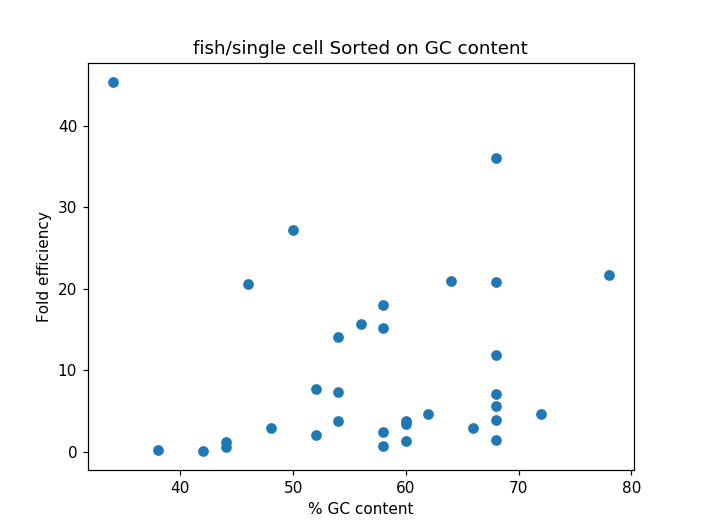

In [1519]:
plt.figure()
plt.scatter([gc_content[i] for i in difference_sc_fish.index], difference_sc_fish.loc[:,'f/s'])

plt.ylabel('Fold efficiency')
plt.xlabel('% GC content')
plt.title('fish/single cell Sorted on GC content')
plt.savefig('fish-div-single-cell mean expression, sort GC content.png', dpi=600)

<IPython.core.display.Javascript object>


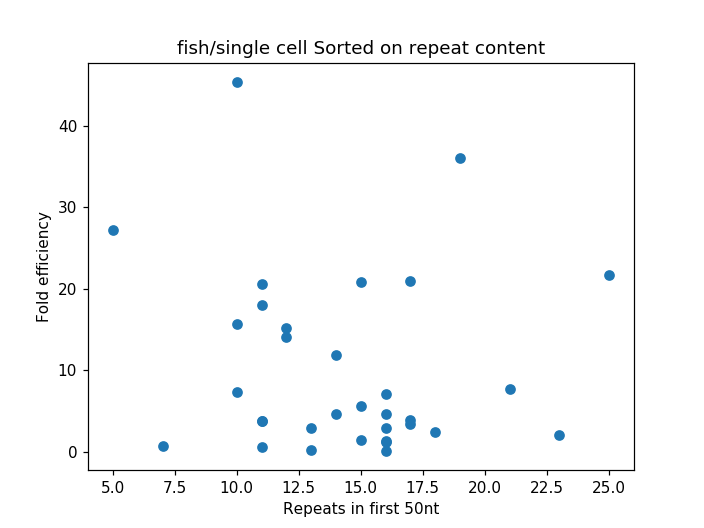

In [1518]:
plt.figure()

plt.scatter([repeats_seq[i] for i in difference_sc_fish.index], difference_sc_fish.loc[:,'f/s'])

plt.ylabel('Fold efficiency')
plt.xlabel('Repeats in first 50nt')
plt.title('fish/single cell Sorted on repeat content')
plt.savefig('fish-div-single-cell mean expression, sort repeat content.png', dpi=600)

## tSNE comparison

In [ ]:
#pc_cl = pca.fit_transform(df_fish_totmol_clean.T)
#model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
#tSNE_points_clean = model.fit_transform(pc_cl[:,:31])
scatter_tSNE(tSNE_points_clean, save=True, name='tSNE_smFISH_totmol_clean')
#pickle.dump(tSNE_points_clean, open( "tSNE_points_df_tot-mol-clean_5028cells_p50_ea15.p", "wb" ))

# tSNE

<IPython.core.display.Javascript object>


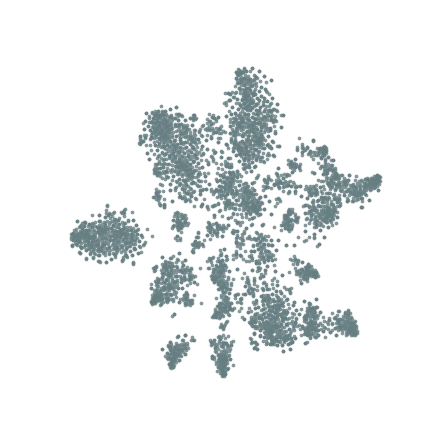

(<matplotlib.figure.Figure at 0x7f09251590f0>,
 <matplotlib.collections.PathCollection at 0x7f092f87c208>)

In [1416]:
def scatter_tSNE(tSNE_data, save=False, name=None):
    
    f = plt.figure(figsize=(4, 4))
    ax = plt.subplot(aspect='equal')
    sc = ax.scatter(tSNE_data[:,0], tSNE_data[:,1], lw=0, s=6, alpha = 0.8, c = '#667e82')
    plt.xlim(-25, 25)
    plt.ylim(-25, 25)
    ax.axis('on')
    ax.axis('tight')
    ax.set_axis_off()
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)
    
    return f, ax, sc

<IPython.core.display.Javascript object>


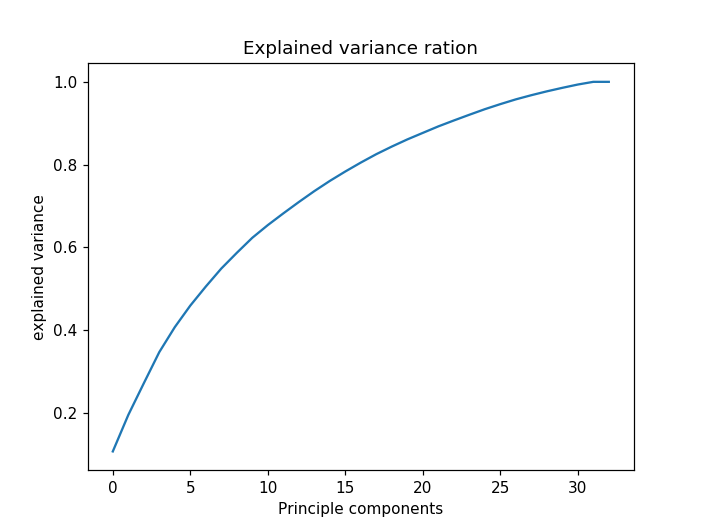

In [1616]:
pca = PCA()
pc = pca.fit_transform(df_fish_totmol_clean.T)

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

<IPython.core.display.Javascript object>


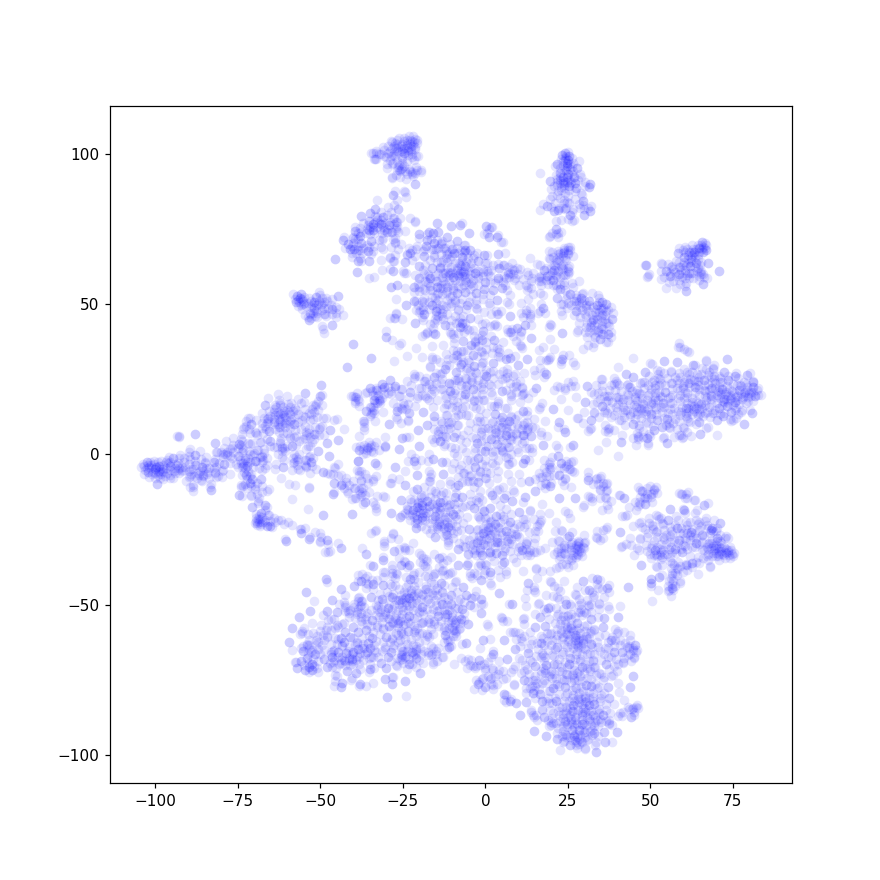

In [1336]:
pc = pca.fit_transform(df_fish_totmol.T)
model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
    #Transpose the data to work on the cells
tSNE_points = model.fit_transform(pc[:,:31])
scatter_tSNE(tSNE_points)
pickle.dump(tSNE_points, open( "tSNE_points_df_tot_mol_5028cells_p50_ea15.p", "wb" ))
df_tSNE_points = pd.DataFrame(data= tSNE_points.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol.columns)

<IPython.core.display.Javascript object>


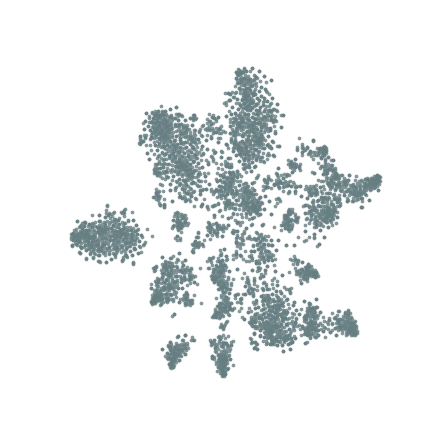

(<matplotlib.figure.Figure at 0x7f092f853ba8>,
 <matplotlib.collections.PathCollection at 0x7f0933b697b8>)

In [1417]:
#pc_cl = pca.fit_transform(df_fish_totmol_clean.T)
#model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
#tSNE_points_clean = model.fit_transform(pc_cl[:,:31])
scatter_tSNE(tSNE_points_clean, save=True, name='tSNE_smFISH_totmol_clean')
#pickle.dump(tSNE_points_clean, open( "tSNE_points_df_tot-mol-clean_5028cells_p50_ea15.p", "wb" ))
#df_tSNE_points_clean = pd.DataFrame(data= tSNE_points_clean.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

## tSNE Comparison

### Single Cell all genes

<IPython.core.display.Javascript object>


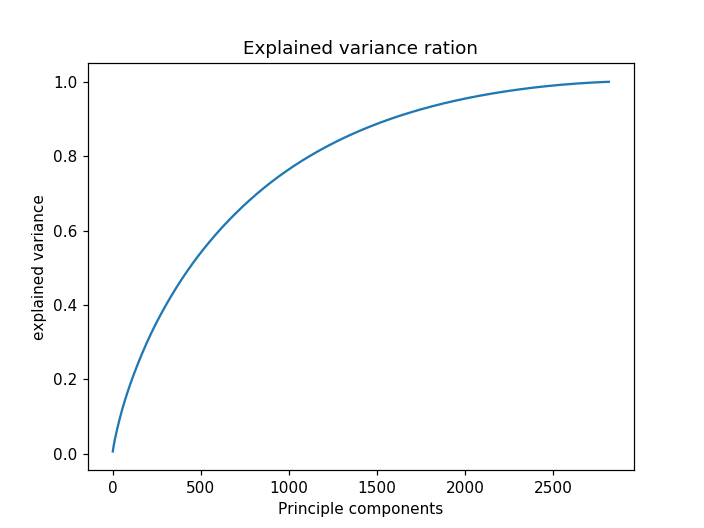

<IPython.core.display.Javascript object>


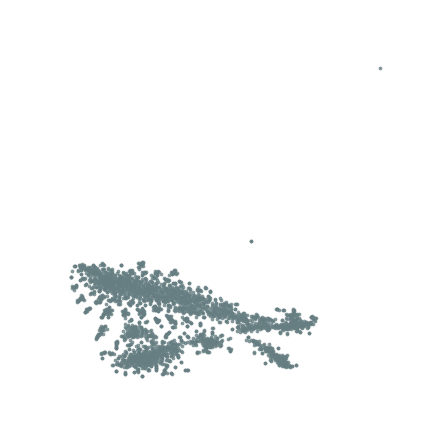

In [1693]:
pca = PCA()
pc_sc_all = pca.fit_transform(df_sc_all_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_all = model.fit_transform(pc_sc_all[:,:31])
scatter_tSNE(tSNE_points_sc_all, save=True, name='tSNE_single-cell_all-genes')
pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_all-genes_31pc_p50_ea15.p", "wb" ))
#df_tSNE_points_clean = pd.DataFrame(data= tSNE_points_clean.T, index=['tSNE1', 'tSNE2'], columns=df_fish_totmol_clean.columns)

<IPython.core.display.Javascript object>


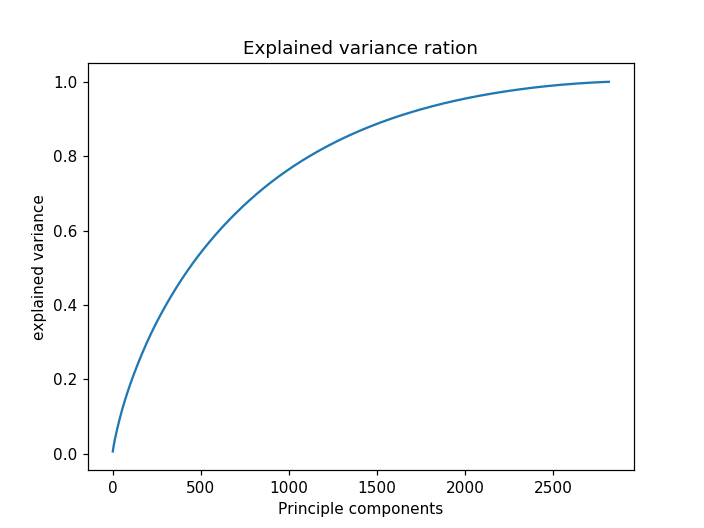

<IPython.core.display.Javascript object>


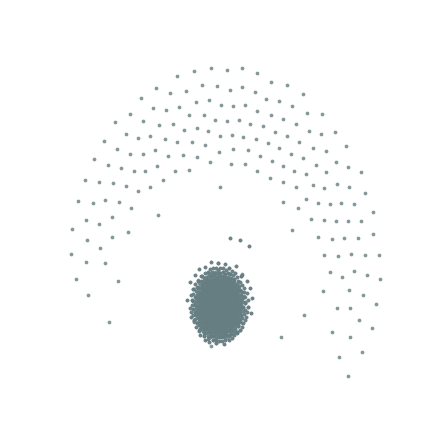

In [1698]:
pca = PCA()
pc_sc_all = pca.fit_transform(df_sc_all_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ration')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_all = model.fit_transform(pc_sc_all[:,:2800])
scatter_tSNE(tSNE_points_sc_all, save=True, name='tSNE_single-cell_all-genes')
pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_all-genes_31pc_p50_ea15.p", "wb" ))

### Single Cell 33 genes

<IPython.core.display.Javascript object>


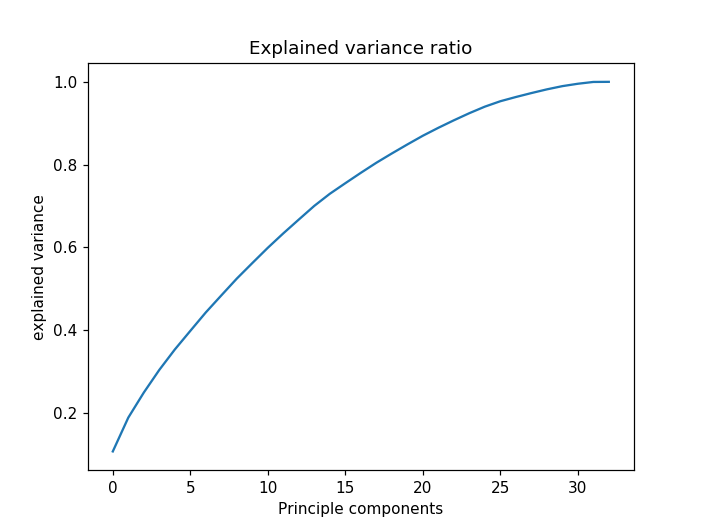

<IPython.core.display.Javascript object>


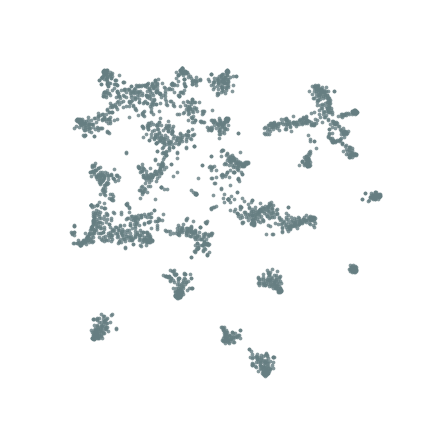

(<matplotlib.figure.Figure at 0x7f093cb367b8>,
 <matplotlib.collections.PathCollection at 0x7f093358b7f0>)

In [1696]:
pca = PCA()
pc_sc_33 = pca.fit_transform(df_sc_totmol.T)
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.title('Explained variance ratio')
plt.xlabel('Principle components')
plt.ylabel('explained variance')

model = TSNE(n_iter=5000, perplexity=50, early_exaggeration=15)
tSNE_points_sc_33 = model.fit_transform(pc_sc_33[:,:31])
scatter_tSNE(tSNE_points_sc_33, save=True, name='tSNE_single-cell_33-genes')
#pickle.dump(tSNE_points_sc_all, open( "tSNE_points_df_single-cell_33-genes_31pc_p50_ea15.p", "wb" ))

## tSNE Expression

<IPython.core.display.Javascript object>


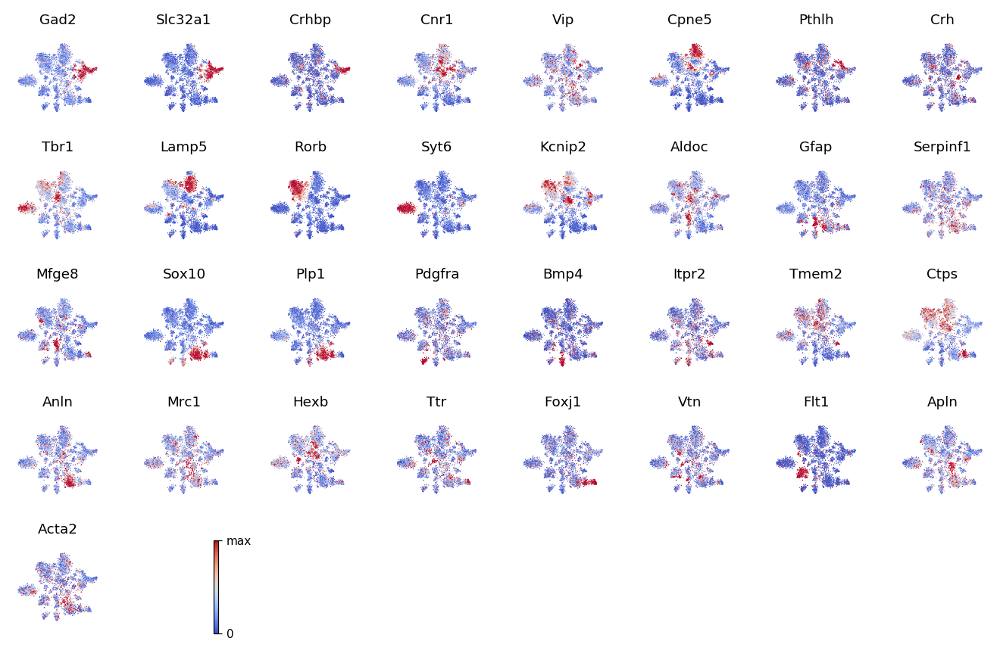

In [1559]:
#Expression plot on tSNE points
def plot_tSNE_Expression(df_tSNE, df, save=False, name=None):
    fig = plt.figure(figsize=(12,8))
    gs = plt.GridSpec(5,8)

    for i, gene in enumerate(df.index):
        plt.subplot(gs[i])
        filt = df_fish.index == gene
        levels = df.loc[filt,:].values.flat[:]
        levels = np.clip(levels, np.percentile(levels, 0), np.percentile(levels,90))
        im = plt.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], color=plt.cm.coolwarm(levels/max(levels)), lw=0, alpha=.99,s=.5)
        
        
        
        for label in plt.gca().axes.get_xticklabels():
            label.set_visible(False)
        for label in plt.gca().axes.get_yticklabels():
            label.set_visible(False)
        plt.title(gene.split('_')[1])
        plt.gca().set_axis_off()
        plt.gca().axis('equal')
    
    plt.subplot(gs[i+1])
    plt.gca().set_axis_off()
    plt.tight_layout()
    m = matplotlib.cm.ScalarMappable(cmap = matplotlib.cm.coolwarm)
    m.set_array(levels)
    colorbar = fig.colorbar(m, ticks=[0, max(levels)])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)
    
plot_tSNE_Expression(df_tSNE_points_clean, df_fish_totmol_clean, save=True, name='tSNE_gene_expression_TL')

# Clustering

In [1058]:
def iterative_clustering(df, expression_threshold, alpha, min_clust_size, dataset_fraction = 0.1, 
                         allow_level_difference=False, max_cycles = 50, post_merge=False, post_merge_r=0.90):
    """
    Automatic clustering by bifurcation. In each cycle the dataset(s) are split into two by 
    agglomerative clustering. Each daughter cluster is evaluated to see if it contains
    more complexity and should be split further or if it is a homogenous cluster. The 
    intermediate and final labels of each cell are added to the label matrix. Each row is
    the result of a clustering cycle where each of the individual labels are split and 
    evaluated. If a cluster is done the label is permanently added to the label matrix.
    When all clusters are done the clustering stops. 
    Optionally it is possible to merge clusters again after clustering. This functionality 
    is added because the agglomerative clustering somtimes makes splits based on a gene
    expression level difference (that can not be caught by the "allow_level_difference"
    parameter), which might not be desirable depending on the expriment/biology.
    Input:
    `df`(pandas dataframe): Dataframe to clusters. Cells as columns, genes as rows.
    `expression_threshold`(float): Value above which a gene is considered expressed. 
        Normalize the data such that the threshold makes sense for all genes.
    `alpha`(float): p-value cutoff for Mann-Whitney U test to decide if there is a 
        expression difference between two clusers. The function makes multiple 
        comparisons. Typicaly an alpha around 0.1e-20 works. 
    `min_cluste_size`(int): Minimal number of cells per cluster.
    `dataset_fraction`(float 0-1): IF a subcluster is larger than the dataset_fraction
        times the number of cells, it is classified as too large and will be further 
        clustered. 
    `allow_level_difference`(bool): Whether or not a cluster is allowed to split based
        on a significant level difference between the same enriched genes. (Does not
        catch all cases, see post_merge)
    `max_cycles`(int): Max number of cycles of clustering. Will print an statement if
        clustering is not yet done when the max number is reached.
    `post_merge`(bool): Merge clusters that correlate with each other and are not 
        considered different using the above criteria (threshold, alpha). This are 
        usually clusters that are split in different cycles, so could not be captured
        by the "allow_level_difference", and differ only based on a expression level
        difference.
    `post_merge_r`(float 0-1): Pearson's r cutoff. All clusters are correlated with
        each other, clusters with a r above the threshold are considered for merging.
        for merging all correlating clusters should match each other. Needs fine tuning
        to make the considered groups of clusters not too big (where is is likely that,
        one of them does not match one of the others) or too small (so that there is not
        enough merging)
    
    """
    
    def cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction, allow_level_difference=False):
        """
        Check if the clusters pass the criteria.
        Returns: 
        Evaluation, format: [x,y]
        x: 0=no enriched genes, 1=same enriched genes, 2=different enriched genes
            3=one of the sub clusters is too large
        y: 0=no differentially expressed genes, 1=same genes differentially expressed
            (level difference), 2=genes differentially expressed

        """
        evaluation = [0,0]

        #Investigate if there are genes enriched in a cluster
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()

        if df1.shape[1] > (dataset_fraction * df.shape[1]) or df2.shape[1] > (dataset_fraction * df.shape[1]):
            evaluation[0] = 3

        elif enriched_df1 == [] and enriched_df2 == []: #No enriched genes in both groups
            evaluation[0] = 0
        elif enriched_df1 == enriched_df2: #Same enriched genes for both groups, level difference
            if allow_level_difference == True:
                evaluation[0] = 1
            else:
                evaluation[0] = 0
        elif enriched_df1 != enriched_df2: #At least one gene differentialy enriched
            evaluation[0] = 2



        #Test if there is a significant difference in the enriched genes between the groups
        diff_expressed = {'df1':[], 
                          'df2':[], # THIS CAN BE REMOVED
                          'both':[]}
        for gene in [i for i in enriched_df1 if i in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['both'].append([gene, test_p])
                evaluation[1] = 1
        for gene in [i for i in enriched_df1 if i not in enriched_df2]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df1'].append([gene, test_p])
                evaluation[1] = 2
        for gene in [i for i in enriched_df2 if i not in enriched_df1]:
            test_p = scipy.stats.mannwhitneyu(df1.loc[gene], df2.loc[gene], alternative='two-sided')[1]
            if test_p < alpha:
                diff_expressed['df2'].append([gene, test_p])
                evaluation[1] = 2
        return evaluation

    def re_cluster(dfs = []):
        """
        Evaluate a list of clusters (dataframes) by splitting them again and 
        evaluating the daughter clusters.
        Input:
        `dfs`(list): List of Pandas dataframes containing one cluster.

        """
        re_evaluation = []
        for d in dfs:
            split = AgglomerativeClustering(n_clusters=2).fit(d.T)
            split_labels = split.labels_ 
            df_daughter_1 = d.loc[:,split_labels == np.unique(split_labels)[0]]
            df_daughter_2 = d.loc[:,split_labels == np.unique(split_labels)[1]]
            re_evaluation.append(cluster_evaluation(df_daughter_1, df_daughter_2, expression_threshold, 
                                                    alpha, dataset_fraction,
                                                    allow_level_difference=allow_level_difference))
        return(re_evaluation)  
    
    def to_graph(l):
        """
        Make a graph of a list of lists
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        G = networkx.Graph()
        for part in l:
            # each sublist is a bunch of nodes
            G.add_nodes_from(part)
            # it also imlies a number of edges:
            G.add_edges_from(to_edges(part))
        return G

    def to_edges(l):
        """ 
        treat `l` as a Graph and returns it's edges 
        to_edges(['a','b','c','d']) -> [(a,b), (b,c),(c,d)]
        From: https://stackoverflow.com/questions/4842613/merge-lists-that-share-common-elements

        """
        it = iter(l)
        last = next(it)

        for current in it:
            yield last, current
            last = current  
            
    def mean_expression(df, labels):
        """
        Make dataframe with mean expression per label.

        """
        #Make df with count averages per cluster
        df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
        for l in np.unique(labels):
            filt = labels == l
            mean = np.array(df.loc[:,filt].T.mean())
            #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
            if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
                df_count_average[l] = mean
        return df_count_average

    #=========================================================================
    finished_clusters = []
    label_ofset = 0
    finished = False

    #Make matrix for labels. First row all zeros
    label_matrix = pd.DataFrame(data= np.zeros((1, df.shape[1])), index = ['Level_0'], columns=df.columns, dtype='Int64')

    for cycle, x in enumerate(range(max_cycles)):

        previous_level = 'Level_{}'.format(cycle)
        current_level = 'Level_{}'.format(cycle + 1)

        if list(set(label_matrix.loc[previous_level]) - set(finished_clusters)) == []:
            print('\nNo difference between the last two label levels. Clustering completed.')
            finished = True
            break

        #Add row and copy labels
        label_matrix.loc[current_level] = label_matrix.loc[previous_level]

        #Loop through all labels that are not in finished_clusters
        for old_label in [i for i in np.unique(label_matrix.loc[current_level]) if i not in finished_clusters]:
            label_ofset += 2
            print('Clustering: {}, label: {}'.format(current_level, old_label))

            #Create dataframe to split
            filt = label_matrix.loc[current_level] == old_label
            df_to_split = df.loc[:,filt]

            #Cluster dataframe into two clusters
            split = AgglomerativeClustering(n_clusters=2).fit(df_to_split.T)
            split_labels = split.labels_ + label_ofset #Labels are 0 and 1, shift them with the clustering step
            unique_split_labels = np.unique(split_labels)

            #Check if all the clusters are larger than the min_clust_size
            if all(i > min_clust_size for i in list(Counter(split_labels).values())):

                #Make df1 & df2
                df1 = df_to_split.loc[:,split_labels == unique_split_labels[0]]
                df2 = df_to_split.loc[:,split_labels == unique_split_labels[1]]

                #Evaluate split
                evaluation = cluster_evaluation(df1, df2, expression_threshold, alpha, dataset_fraction)

                print('    Daughter clusters labels: {}, evaluation of split: {}'.format(unique_split_labels, evaluation))
                #List of the labels that are valid clusters (or will be in the next cycle)
                valid_labels = []

                #_____________________________________________________________________
                if evaluation[0] == 3:
                    print('    At least one of the daughter clusters is too large')
                    threshold = dataset_fraction * df.shape[1]
                    if df1.shape[1] > threshold and df2.shape[1] > threshold:
                        valid_labels.extend(unique_split_labels)
                    elif df1.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[0])
                        re_evaluation = re_cluster([df2])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[1])
                            valid_labels.append(unique_split_labels[1])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[1])
                    elif df2.shape[1] > threshold:
                        valid_labels.append(unique_split_labels[1])
                        re_evaluation = re_cluster([df1])
                        if re_evaluation[0][1] == 0:
                            finished_clusters.append(unique_split_labels[0])
                            valid_labels.append(unique_split_labels[0])
                        else: #Difference in daughters, continue clustering
                            valid_labels.append(unique_split_labels[0])


                #No enriched genes, NO expression difference
                elif evaluation[0] == 0:
                    print('    No enriched genes, No expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #No valid daughter clusters in the next cycle
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0:
                        finished_clusters.append(old_label)
                        print('    Encountered a cluster without expression: {}{}'.format(current_level, old_label))
                    #Valid daughter clusters in the next cycle
                    else:
                        valid_labels.extend(unique_split_labels)

                #Different genes enriched, expression difference
                elif evaluation[0] == 2 and evaluation[1] == 2:
                    print('    Different enriched genes, expression difference')
                    re_evaluation = re_cluster([df1, df2])
                    #First cluster
                    if re_evaluation[0][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[0])
                        valid_labels.append(unique_split_labels[0])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[0])
                    #Second cluster
                    if re_evaluation[1][1] == 0: #no difference in daughter clusters, current cluster finished
                        finished_clusters.append(unique_split_labels[1])
                        valid_labels.append(unique_split_labels[1])
                    else: #Difference in daughters, continue clustering
                        valid_labels.append(unique_split_labels[1])    


                #Different genes enriched, NO expression difference
                elif evaluation[0] == 2 and evaluation[1] == 0:
                    print('    Encounterd a difference but no significant difference {} {}-->{}'.format(current_level, old_label, unique_split_labels))
                    re_evaluation = re_cluster([df1, df2])
                    if re_evaluation[0][1] == 0 and re_evaluation[1][1] == 0: #No valid daughter clusters
                        finished_clusters.append(old_label)
                    else:
                        valid_labels.extend(unique_split_labels)

                #Same or more enriched, expression level difference
                elif evaluation[0] > 0 and evaluation[1] == 1:
                    print('    Encountered a split with similar expressed genes')
                    if allow_level_difference == True:
                        valid_labels.extend(unique_split_labels)
                        finished_clusters.extend(unique_split_labels)
                    else:
                        finished_clusters.append(old_label)


                #Same enriched, NO expression difference
                elif evaluation[0] == 1 and evaluation[1] == 0:
                    print('    Same genes enriched but no expression idfference')
                    finished_clusters.append(old_label) #Not a valid split, current cluster finished  

                else:
                    print('ERROR, Split evaluation did not fit the criteria: {} in: {} {}'.format(evaluation, current_level, old_label))

                #_____________________________________________________________________

            else:
                finished_clusters.append(old_label)

            #Add labels to matrix
            final_split_labels = [old_label if i not in valid_labels else i for i in split_labels]
            for c, i in enumerate(filt):
                if i == True:
                    count_true = Counter(filt[:c])[True] #Count how many Trues already have been passed
                    label_matrix.loc[current_level][c] = final_split_labels[count_true] #Add the new labels to the label matrix
            print('Finished Clusters:  {}\n'.format(finished_clusters))
    
    if finished == False:
        print('Max number of cycles reached. Possibly there is more structure with more rounds of clustering.')
    print('\nClustering finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), np.unique(label_matrix.iloc[-1])))
    
    if post_merge == True:
        #Make mean expression dataframe with last level labels and cross correlate clusters
        mean_exp = mean_expression(df, label_matrix.iloc[-1])
        clust_correlation = mean_exp.corr(method='pearson').values
        clust_correlation = np.triu(clust_correlation, k=1)
        #Select clusters with rho > threshold and group similar clusters
        connected_clusters = np.where(clust_correlation > post_merge_r)
        connected_clusters = [list(i) for i in zip(connected_clusters[0], connected_clusters[1])]
        G = to_graph(connected_clusters)
        cluster_sets = connected_components(G)
    
            
        label_matrix.loc['Post_merge'] = label_matrix.iloc[-1]
        max_label = label_matrix.iloc[-1].max()
        print('Post merging clusters that have a pearson r > {}'.format(post_merge_r))
        for n, s in enumerate(cluster_sets):
            labels_to_merge = np.take(np.unique(label_matrix.iloc[-2]), list(s))
            eval_simularity = []
            
            for i in itertools.combinations(labels_to_merge, 2):
                filt = label_matrix.iloc[-2] == i[0]
                df_sim1 = df.loc[:, filt]
                filt = label_matrix.iloc[-2] == i[1]
                df_sim2 = df.loc[:, filt]
                eval_simularity.append(cluster_evaluation(df_sim1, df_sim2, expression_threshold, alpha, 
                                                          dataset_fraction, allow_level_difference=False)[1])  
                print(eval_simularity)
            if 2 not in eval_simularity:
                label_matrix.loc['Post_merge' , label_matrix.loc['Post_merge'].isin(labels_to_merge)] = max_label + n + 1
                print('Merged clusters {} into cluster {}'.format(labels_to_merge, max_label + n + 1))
            else:
                print('Did NOT merge clusters {}, there is an expression difference'.format(labels_to_merge))    
            
            
            
            
            
        print('\nMerging finished. Result {} clusters with labels: {}\n'.format(len(np.unique(label_matrix.iloc[-1])), 
                                                                                np.unique(label_matrix.iloc[-1])))
    return label_matrix




label_matrix = iterative_clustering(df_fish_totmol, 
                     expression_threshold = 400, 
                     alpha = 0.1e-20,
                     min_clust_size = 15, 
                     dataset_fraction = 0.05, 
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge = True,
                     post_merge_r = 0.865) #0.86

"""(df_fish_totmol, 
                     expression_threshold = 400, 
                     alpha = 0.1e-20,
                     min_clust_size = 15, 
                     dataset_fraction = 0.05, 
                     allow_level_difference=False, 
                     max_cycles = 50,
                     post_merge = True,
                     post_merge_r = 0.865)"""

Clustering: Level_1, label: 0
    Daughter clusters labels: [2 3], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 2
    Daughter clusters labels: [4 5], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  []

Clustering: Level_2, label: 3
    Daughter clusters labels: [6 7], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 4
    Daughter clusters labels: [8 9], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7]

Clustering: Level_3, label: 5
    Daughter clusters labels: [10 11], evaluation of split: [3, 1]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11]

Clustering: Level_3, label: 6
    Daughter clusters labels: [12 13], evaluation of split: [3, 1]
    At least one of the 

Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75]

Clustering: Level_12, label: 74
    Daughter clusters labels: [78 79], evaluation of split: [2, 2]
    Different enriched genes, expression difference
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75, 78, 79]

Clustering: Level_13, label: 76
    Daughter clusters labels: [80 81], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54, 66, 67, 68, 69, 73, 75, 78, 79, 81]

Clustering: Level_13, label: 77
    Daughter clusters labels: [82 83], evaluation of split: [3, 2]
    At least one of the daughter clusters is too large
Finished Clusters:  [7, 11, 13, 10, 21, 27, 17, 20, 35, 37, 25, 41, 43, 45, 47, 36, 51, 55, 50, 61, 62, 63, 54

'(df_fish_totmol, \n                     expression_threshold = 400, \n                     alpha = 0.1e-20,\n                     min_clust_size = 15, \n                     dataset_fraction = 0.05, \n                     allow_level_difference=False, \n                     max_cycles = 50,\n                     post_merge = True,\n                     post_merge_r = 0.865)'

In [1845]:
def mean_expression(df, labels):
    """
    Make dataframe with mean expression
    
    """
    #Make df with count averages per cluster
    df_count_average = pd.DataFrame(index=df.index, columns=np.sort(np.unique(labels))) #np.unique(labels_a))
    for l in np.unique(labels):
        filt = labels == l
        mean = np.array(df.loc[:,filt].T.mean())
        #std = np.array(np.std(df_sort.loc[:,filt], axis=1))
        if np.isnan(np.sum(mean)) == False: #In case some clusters do not have cells
            df_count_average[l] = mean
    return df_count_average

def heat_map(df, labels, sort=None, cluster_colors=None, cluster_number = False, save=False, name=''):
    """
    Plot heat_map of a dataframe
    
    """
    #Find the name of the input df, for logging
    df_input_name =[x for x in globals() if globals()[x] is df][0]
    print('DF used for plot: {}'.format(df_input_name))
    
    if sort == None:
        optimal_order = np.unique(labels)    
    else:
        optimal_order = sort
    print('Order of clusters: {}'.format(optimal_order))
    
    #Sort the cells according to the optimal cluster order
    optimal_sort_cells = []
    for i in optimal_order:
        optimal_sort_cells.extend(label_cells[i])
    
    #Create a list of optimal sorted cell labels
    optimal_sort_labels = []
    for i in optimal_sort_cells:
        optimal_sort_labels.append(cell_labels[i])
    
    fig, axHM = plt.subplots(figsize=(9,5))
    
    df_full = df.copy() # _fish_log
    z = df_full.values
    z = z/np.percentile(z, 99, 1)[:,None]
    z = pd.DataFrame(z, index=df_full.index, columns=df_full.columns)
    z = z.loc[:,optimal_sort_cells].values
    print(z.shape)
    
    im = axHM.pcolormesh(z, cmap='viridis', vmax=1)
    
    arial_font = {'fontname' : 'Arial'}
    plt.yticks(np.arange(0.5, len(df.index), 1), gene_sort, fontsize=8, **arial_font)
    plt.gca().invert_yaxis()
    plt.xlim(xmax=len(labels))
    print(len(labels))
    #plt.title(df_input_name)

    divider = make_axes_locatable(axHM)
    axLabel = divider.append_axes("top", .3, pad=0, sharex=axHM)

    
    #axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='jet')
        #Colors, see below:
    #axLabel.pcolor(optimal_sort_labels, cmap=[cluster_colors[i] for i in labels])  #label_colors_hex
    
    if cluster_colors == None:
        optimal_sort_labels = np.array(optimal_sort_labels)
        axLabel.pcolor(optimal_sort_labels[None,:]/max(optimal_sort_labels), cmap='jet')
    else:
        counter = Counter(labels)
        print(counter)
        pos=0
        for l in optimal_order:
            axLabel.barh(bottom = 0, left = pos, width = counter[l], color=cluster_colors[l],
                        linewidth=0.5, edgecolor=cluster_colors[l])
            if cluster_number==True:
                axLabel.text(pos + (counter[l]/2), 0, l, fontsize=8,
                         horizontalalignment='center', verticalalignment='center', **arial_font )
            pos += Counter(labels)[l]
    
    axLabel.set_xlim(xmax=len(labels))
    axLabel.axis('off')
    
    cax = fig.add_axes([.91, 0.13, 0.01, 0.22])
    colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
    colorbar.set_ticklabels(['0', 'max'])
    
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=300)
    
    
def gen_labels(df, model):
    """
    Generate cell labels from model.
    Input:
    `df`: Panda's dataframe that has been used for the clustering. (used to get
    the names of colums and rows)
    `model`(obj): Clustering object
    Returns (in this order):
    `cell_labels` = Dictionary coupling cellID with cluster label
    `label_cells` = Dictionary coupling cluster labels with cellID
    `cellID` = List of cellID in same order as labels
    `labels` = List of cluster labels in same order as cells
    `labels_a` = Same as "labels" but in numpy array
    
    """
    if str(type(model)).startswith("<class 'sklearn.cluster"):
        cell_labels = dict(zip(df.columns, model.labels_))
        label_cells = {}
        for l in np.unique(model.labels_):
            label_cells[l] = []
        for i, label in enumerate(model.labels_):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model.labels_)
        labels_a = model.labels_
    elif type(model) == np.ndarray:
        cell_labels = dict(zip(df.columns, model))
        label_cells = {}
        for l in np.unique(model):
            label_cells[l] = []
        for i, label in enumerate(model):
            label_cells[label].append(df.columns[i])
        cellID = list(df.columns)
        labels = list(model)
        labels_a = model
    else:
        print('Error wrong input type')
    
    return cell_labels, label_cells, cellID, labels, labels_a


In [1866]:
last_level = label_matrix.iloc[-1]

cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol, np.array(last_level))
print(len(np.unique(labels_a)))

33


In [1869]:
#Remove Bad clusters. 
bad_clusters = [86, 88]
label_matrix_clean = label_matrix.copy()
for i in bad_clusters:
    label_matrix_clean = label_matrix_clean.loc[:,label_matrix.loc['Post_merge'] != i]
    
df_fish_totmol_clean = df_fish_totmol.loc[:, label_matrix_clean.columns]

last_level = label_matrix_clean.iloc[-1]
cell_labels, label_cells, cellID, labels, labels_a = gen_labels(df_fish_totmol_clean, np.array(last_level))
print(len(np.unique(labels_a)))

31


DF used for plot: df_fish_totmol_clean
Order of clusters: [66, 68, 69, 93, 78, 85, 47, 73, 87, 55, 54, 45, 21, 13, 90, 91, 79, 63, 62, 43, 17, 61, 41, 94, 83, 75, 81, 27, 37, 92, 89]


<IPython.core.display.Javascript object>


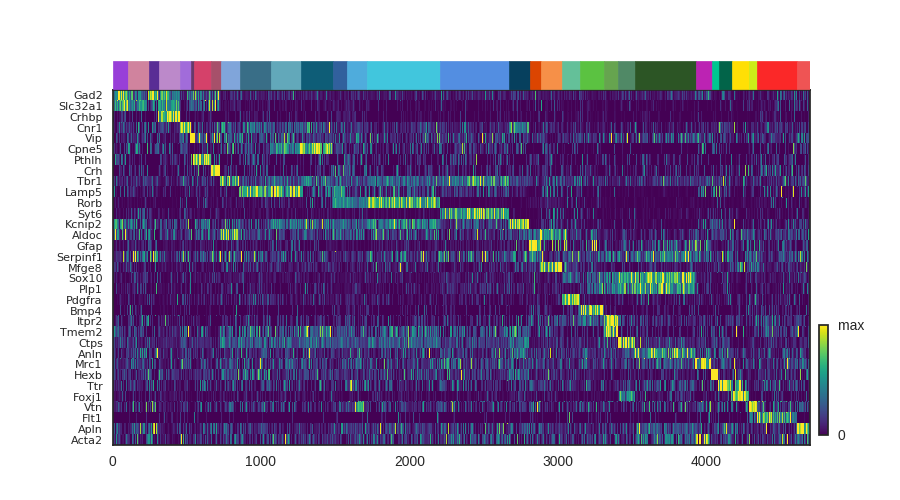

(33, 4700)
4700
Counter({90: 494, 91: 466, 94: 407, 92: 271, 45: 218, 55: 207, 54: 201, 17: 162, 93: 143, 62: 142, 68: 139, 79: 136, 13: 135, 87: 129, 43: 121, 27: 117, 47: 114, 41: 114, 83: 110, 66: 106, 21: 95, 61: 94, 81: 88, 89: 86, 63: 78, 78: 76, 69: 68, 73: 64, 37: 54, 75: 45, 85: 20})


In [1870]:

heat_map(df_fish_totmol_clean, labels, cluster_colors=cluster_colors, cluster_number=False,
        sort=[66,68,69,93,78,85,47,73,87,55,54,45,21,13,90,91,79,63,62,43,17,61,41,94,83,75,81,27,37,92,89],
        save=False, name='Heatmap_31cl_totmol_171123_3-4size') #, 86,88

In [1048]:
pickle.dump(cell_labels,  open( "cell_labels_5208_totmol.p", "wb" ))

In [1014]:
def compare_merge(df, labels, l, expression_threshold):
    mean_df = mean_expression(df, labels)
    for i in l:
        print('{}\n{}'.format(i , mean_df.loc[mean_df.loc[:,i]>expression_threshold, i]))

        
    for i in itertools.combinations(l, 2):
        print('\nmerging: {}'.format(i))
        print('Correlation: {}'.format(mean_df.corr().loc[i[0], i[1]]))
        
        df1 = df.loc[:, labels == i[0]]
        df2 = df.loc[:, labels == i[1]]
        enriched_df1 = df1[df1.mean(axis=1) > expression_threshold].index.tolist()
        enriched_df2 = df2[df2.mean(axis=1) > expression_threshold].index.tolist()
        
        enriched = set(enriched_df1 + enriched_df2)
        for i in enriched:
            print('{} {}'.format(i, scipy.stats.mannwhitneyu(df1.loc[i], df2.loc[i], alternative='two-sided')[1]))


compare_merge(df_fish_totmol, labels_a, [13, 21], 300)
#compare_merge(df_fish_totmol, labels_a, [7,20,21], 300)

13
Hybridization7_Rorb    609.730079
Hybridization12_Vtn    303.845457
Name: 13, dtype: float64
21
Hybridization12_Kcnip2    367.041482
Hybridization9_Lamp5      592.130325
Hybridization7_Rorb       805.052501
Name: 21, dtype: float64

merging: (13, 21)
Correlation: 0.7126670253707578
Hybridization7_Rorb 1.2318164962511082e-09
Hybridization12_Kcnip2 2.7573133887522896e-13
Hybridization12_Vtn 5.101989310439969e-12
Hybridization9_Lamp5 4.521983895187586e-28


In [2017]:
cluster_names = {13: 'Pyramidal L4 2',
17: 'Oligodendrocyte COP',
21: 'Pyramidal interface L3-4',
27: 'Ependymal',
37: 'Pericytes',
41: 'Opigodendrocytes MF',
43: 'OPC',
45: 'Lamp5+',
47: 'Interneuron Kcnip Pthlh',
54: 'Pyramidal L2-3',
55: 'Pyramidal L2-3 L5',
61: 'Oligodendrocyte NF',
62: 'Astrocyte Mfge8',
63: 'Astrocyte Gfap',
66: 'Interneuron Kcnip2',
68: 'Interneuron Kcnip2, Syt6',
69: 'Interneuron Gad2 Slc32a1-',
73: 'Interneuron Cnr1 Vip Crh',
75: 'Microglia',
78: 'Interneuron Cnr1',
79: 'Hippocampal neuron',
81: 'Choroid plexus',
83: 'PVM VSM',
85: 'Interneuron Vip',
86: 'Interneuron Lamp5',
87: 'Pyramidal L5',
88: 'BQ',
89: 'Endothelial 1',
90: 'Pyramidal L4',
91: 'Pyramidal L6',
92: 'Endothelial',
93: 'Interneuron Crhbp',
94: 'Oligodendrocyte mature'}

In [1303]:
major_clusters = {
    'Inhibitory' : [47,66,68,69,73,78,85,86,93],
    'Excitatory' : [21,54,55,79,87,90,91],
    'Astrocytes' : [62,63],
    'Oligodendrocytes' : [17,41,43,61,94],
    'PVM-VSM' : [83],
    'Microglia': [75],
    'Choroid plexus' : [81],
    'Ependimal' : [27],
    'Pericytes' : [37],
    'Endothelial' : [92, 89]
}

major_cluster_colors = {
    'Inhibitory' : '#d40d79',
    'Excitatory' : '#07a2d5',
    'Astrocytes' : '#f1880b',
    'Oligodendrocytes' : '#15cb33',
    'PVM-VSM' : '#950cae',
    'Microglia': '#11c48f',
    'Choroid plexus' : '#0c644a',
    'Ependimal' : '#ffde00',
    'Pericytes' : '#cbeb1c',
    'Endothelial' : '#fa2e2b' 
}

In [1044]:
cluster_colors = {
    13: '#4facdc',
    17: '#5bc241',
    21: '#31609d',
    27: '#ffdf05',
    37: '#ccec19',
    41: '#508966',
    43: '#64c099',
    45: '#0e5d77',
    47: '#d5416a',
    54: '#62a8ba',
    55: '#396e87',
    61: '#66a44f',
    62: '#f69048',
    63: '#dc4501',
    66: '#983fd8',
    68: '#d0839e',
    69: '#592d95',
    73: '#a7506a',
    75: '#00c690',
    78: '#a16cda',
    79: '#06405e',
    81: '#026449',
    83: '#bc23b3',
    85: '#68396c',
    86: '#cf47ac',
    87: '#80a5da',
    88: '#6b6b6b',
    89: '#ef5454',
    90: '#41c6dd',
    91: '#538ee1',
    92: '#fb2828',
    93: '#bc89ca',
    94: '#2c5525'
}

In [1871]:
for i in [66,68,69,93,78,85,47,73,87,55,54,45,21,13,90,91,79,63,62,43,17,61,41,94,83,75,81,27,37,92,89]:
    print(i, cluster_colors[i], cluster_names[i])

66 #983fd8 Interneuron Kcnip2
68 #d0839e Interneuron Kcnip2, Syt6
69 #592d95 Interneuron Gad2 Slc32a1-
93 #bc89ca Interneuron Crhbp
78 #a16cda Interneuron Cnr1
85 #68396c Interneuron Vip
47 #d5416a Interneuron Kcnip Pthlh
73 #a7506a Interneuron Cnr1 Vip Crh
87 #80a5da Pyramidal L5
55 #396e87 Pyramidal L2-3 L5
54 #62a8ba Pyramidal L2-3
45 #0e5d77 Cpne5+
21 #31609d Pyramidal interface L3-4
13 #4facdc Pyramidal L4 2
90 #41c6dd Pyramidal L4
91 #538ee1 Pyramidal L6
79 #06405e Hippocampal neuron
63 #dc4501 Astrocyte Gfap
62 #f69048 Astrocyte Mfge8
43 #64c099 OPC
17 #5bc241 Oligodendrocyte COP
61 #66a44f Oligodendrocyte NF
41 #508966 Opigodendrocytes MF
94 #2c5525 Oligodendrocyte mature
83 #bc23b3 PVM VSM
75 #00c690 Microglia
81 #026449 Choroid plexus
27 #ffdf05 Ependymal
37 #ccec19 Pericytes
92 #fb2828 Endothelial
89 #ef5454 Endothelial 1


In [1347]:
df_tSNE_points_clean

,1124,2325,2400,241,6248,2573,330,1149,6527,4813,...,821,1217,5162,532,3607,3251,2757,1228,1234,4653
tSNE1,-4.458117,-92.083282,-87.714989,17.848551,37.158806,-81.854530,-40.837440,9.761390,-12.635174,-38.134384,...,1.358690,-6.495807,-10.527846,-55.472416,7.302249,38.266697,29.950249,27.215412,33.755585,11.208045
tSNE2,-48.672142,1.804769,-2.090581,-8.176021,30.317408,1.203964,-73.895874,-53.655628,32.364929,57.149101,...,22.443239,-83.546051,19.916590,15.929206,53.445522,-58.349674,-60.713234,-69.772484,-65.678314,74.414368


<IPython.core.display.Javascript object>


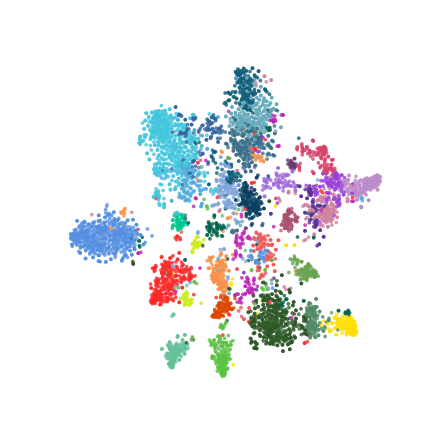

In [1397]:
def plot_tSNE_clusters(df, df_tSNE, labels_a, save=False, name=None):
    plt.figure(figsize=(4, 4))
    plt.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], s=6, alpha=0.8, lw=0,
               c= [cluster_colors[i] for i in labels_a])
    plt.gca().set_axis_off()
    if save == True:
        plt.savefig('{}.png'.format(name), dpi=600)

plot_tSNE_clusters(df_fish_totmol_clean, df_tSNE_points_clean, labels_a, save=True, name='tSNE_31cl_totmol')

<IPython.core.display.Javascript object>


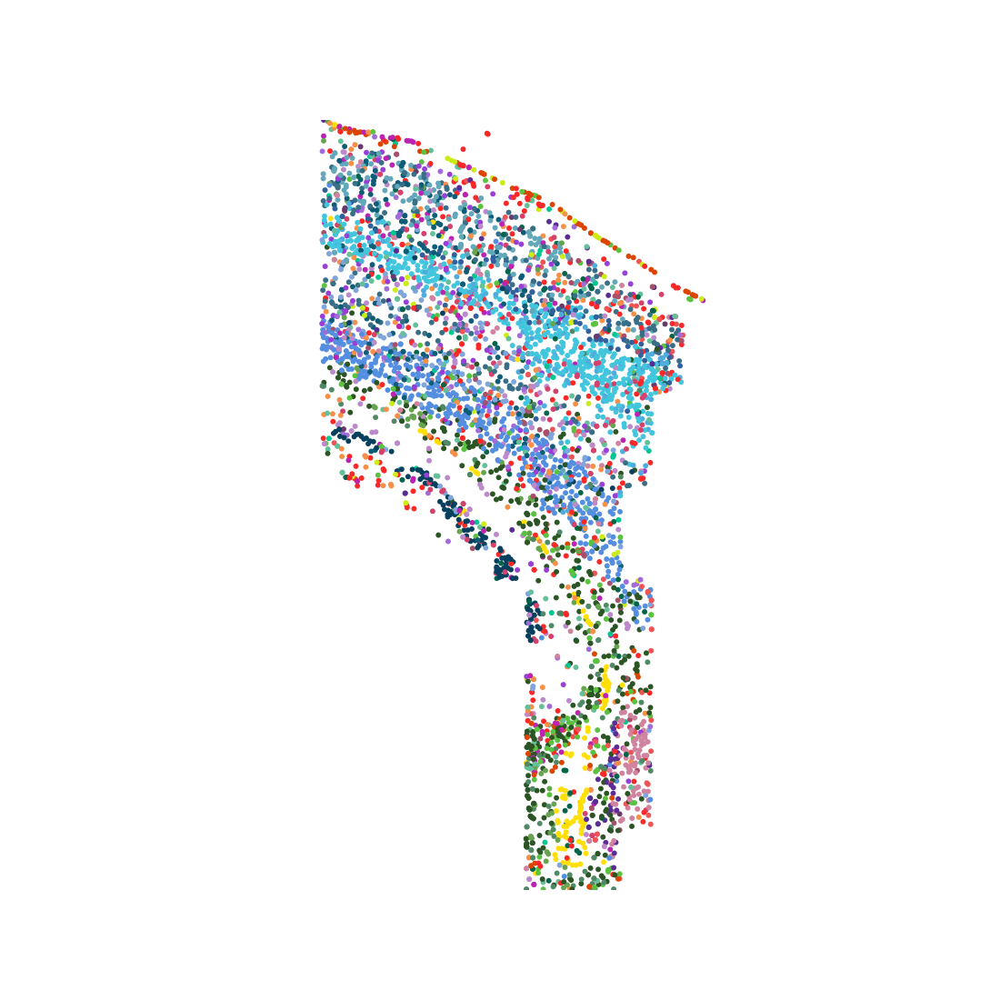

In [1398]:
plt.figure(figsize=(10,10))
color_labels_sort =[cluster_colors[i] for i in labels_a]
plt.scatter(coord_df.loc['X',df_fish_totmol_clean.columns], coord_df.loc['Y',df_fish_totmol_clean.columns], linewidths=0, c=color_labels_sort, s=15)
plt.gca().invert_xaxis()
plt.gca().invert_yaxis()
plt.gca().axis('equal')
plt.xlim([coord_df.loc['X'].max(), coord_df.loc['X'].min()])
plt.ylim([coord_df.loc['Y'].max(), coord_df.loc['Y'].min()])
plt.gca().set_axis_off()

#plt.savefig('Centroid_cluster_colour.png', dpi=600)

<IPython.core.display.Javascript object>


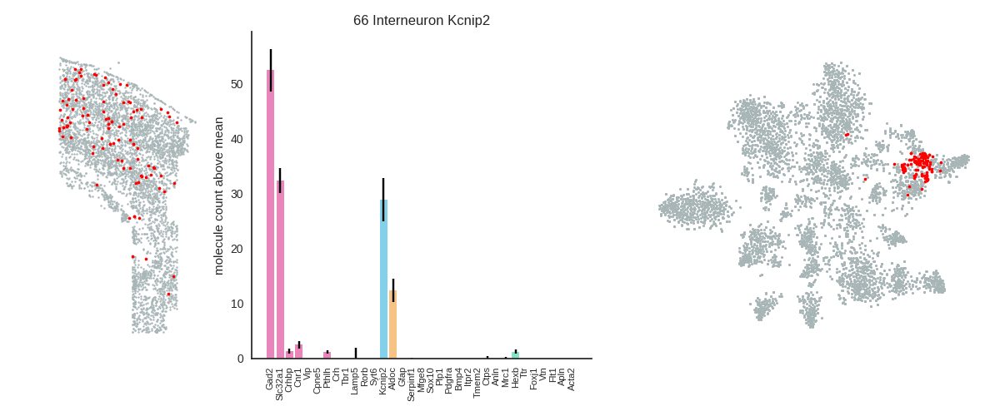

<IPython.core.display.Javascript object>


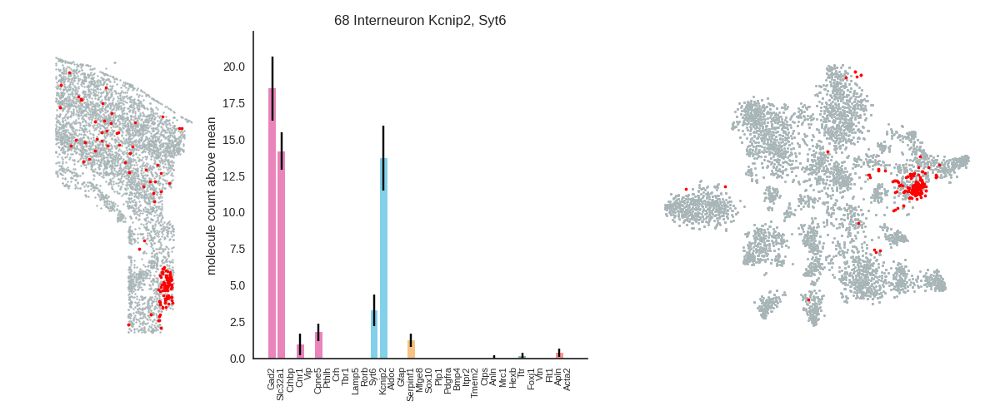

<IPython.core.display.Javascript object>


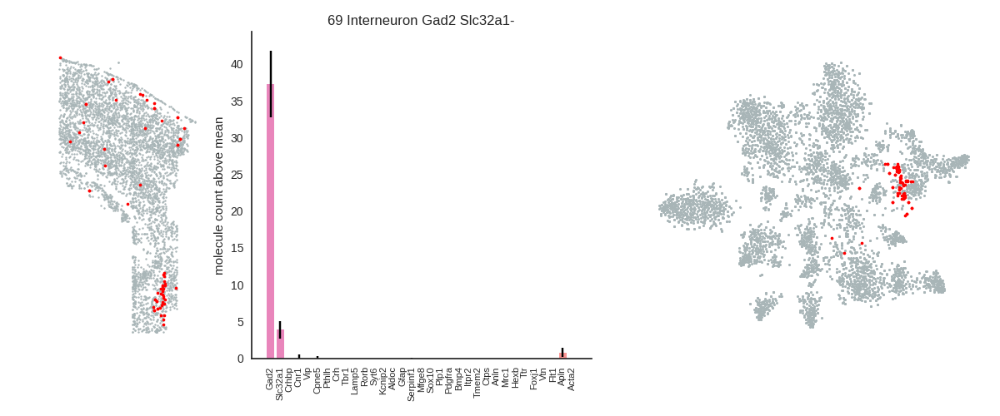

<IPython.core.display.Javascript object>


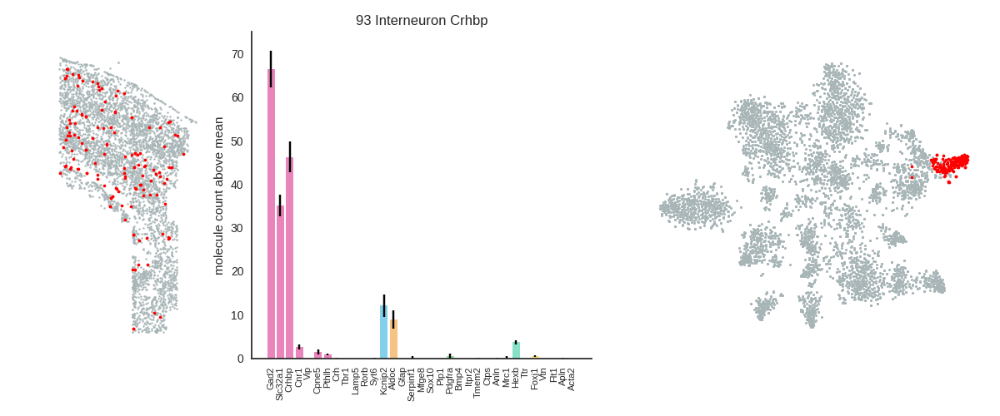

<IPython.core.display.Javascript object>


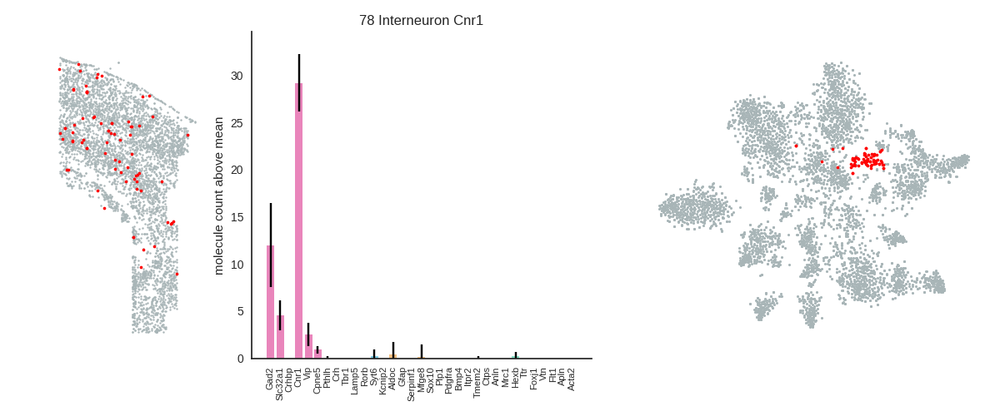

<IPython.core.display.Javascript object>


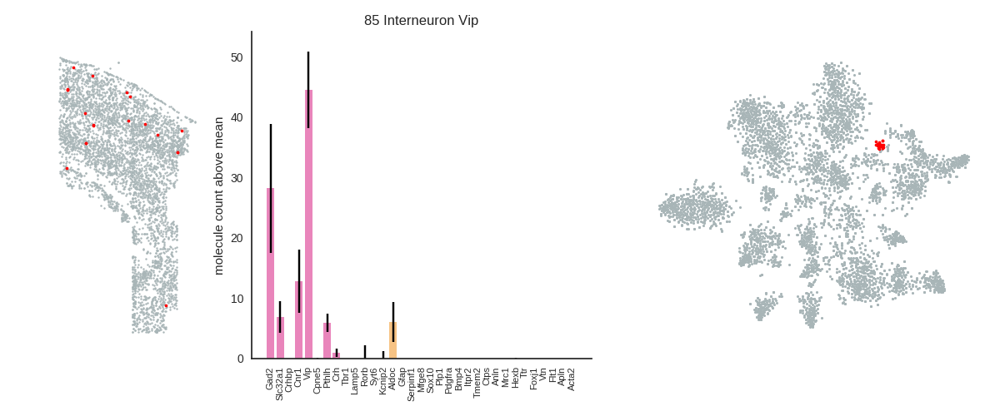

<IPython.core.display.Javascript object>


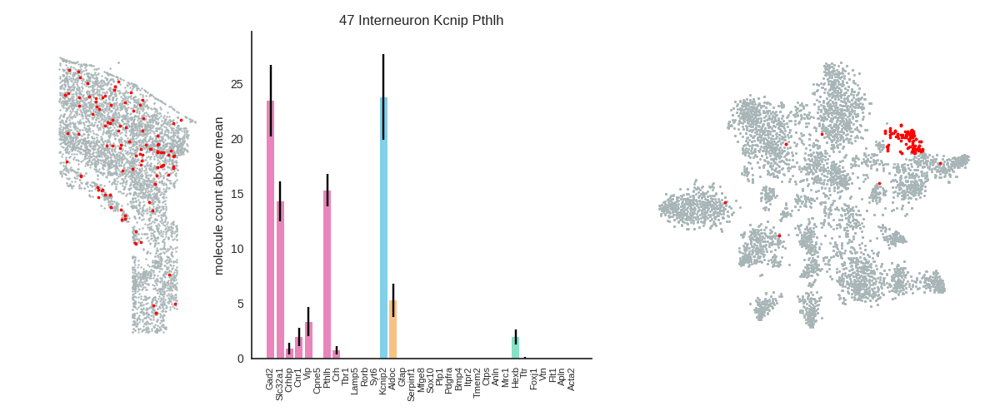

<IPython.core.display.Javascript object>


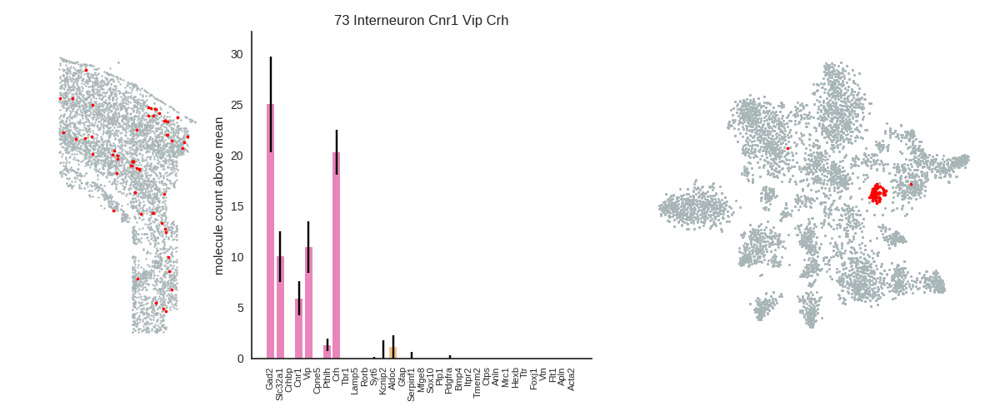

<IPython.core.display.Javascript object>


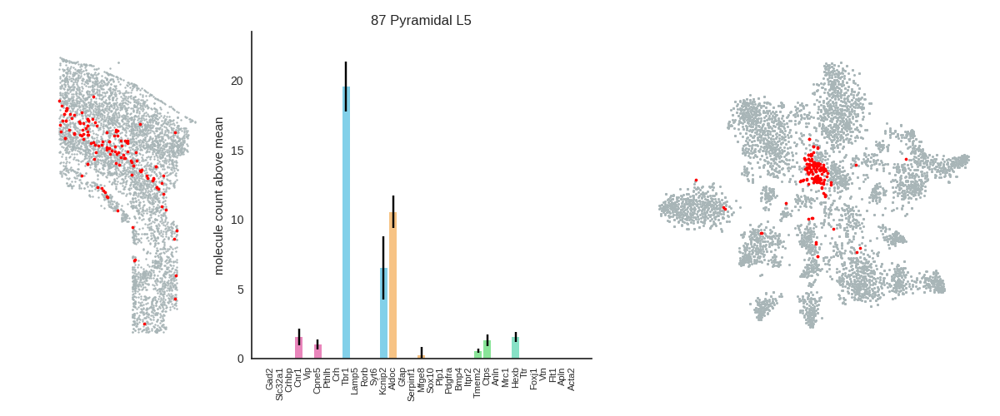

<IPython.core.display.Javascript object>


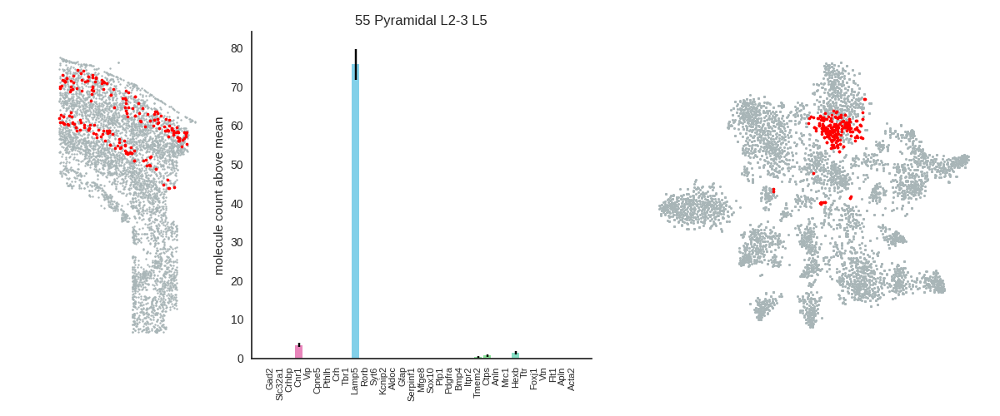

<IPython.core.display.Javascript object>


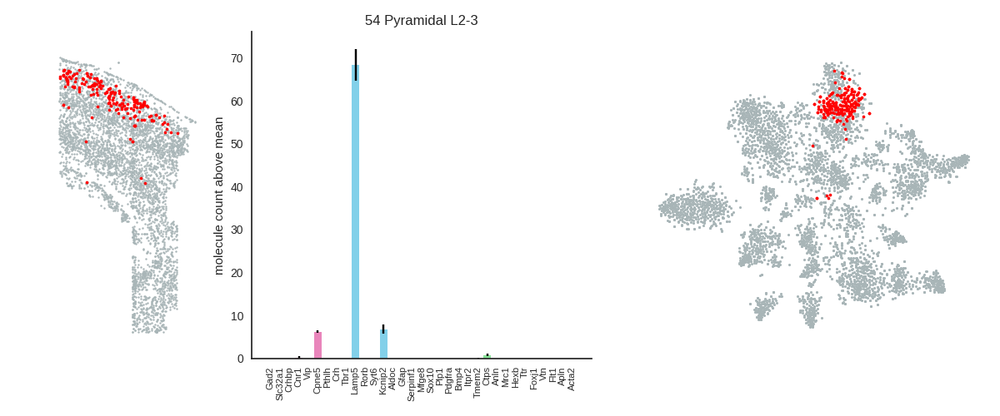

<IPython.core.display.Javascript object>


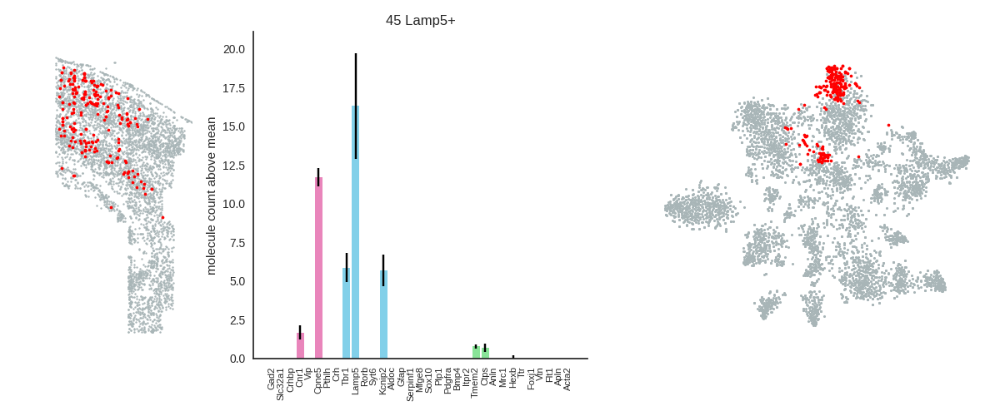

<IPython.core.display.Javascript object>


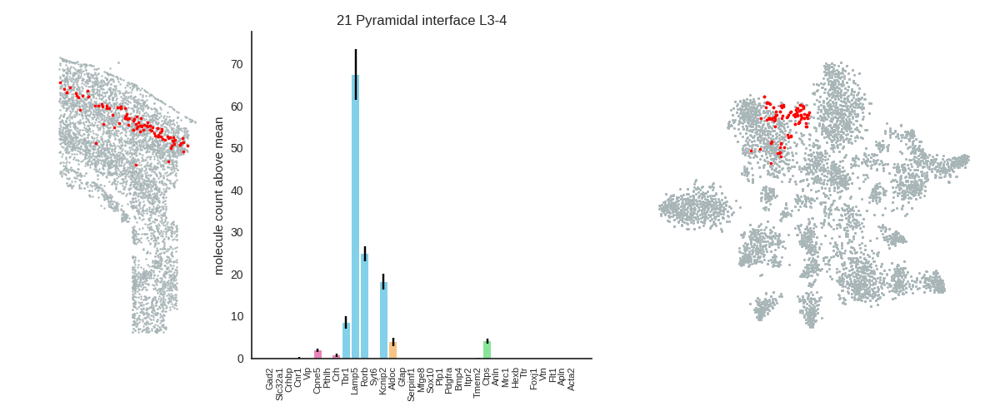

<IPython.core.display.Javascript object>


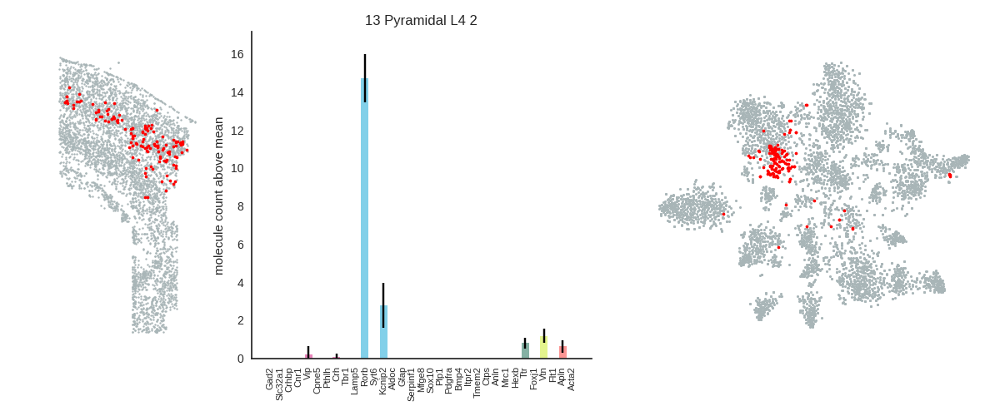

<IPython.core.display.Javascript object>


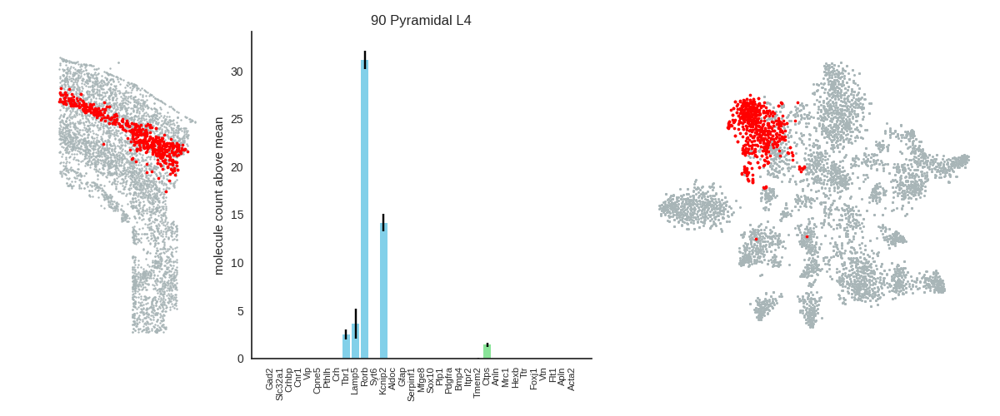

<IPython.core.display.Javascript object>


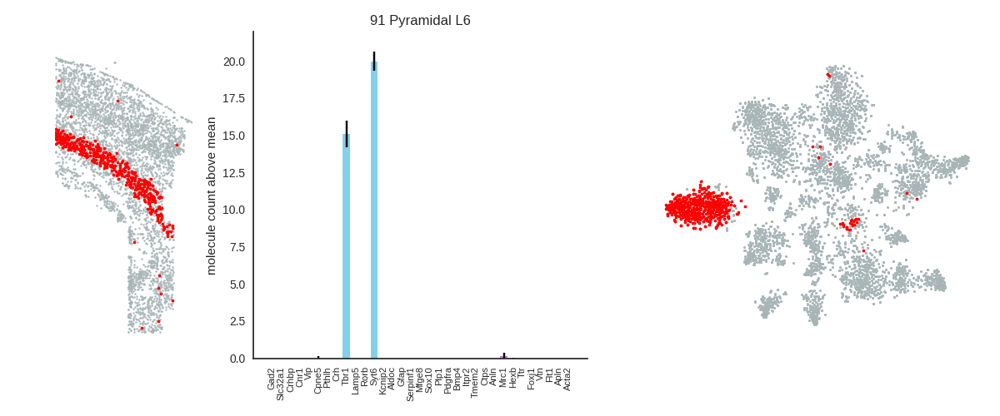

<IPython.core.display.Javascript object>


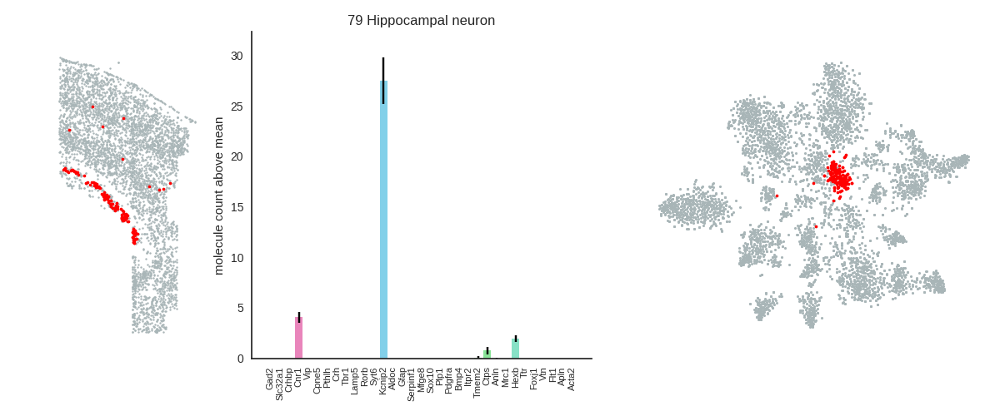

<IPython.core.display.Javascript object>


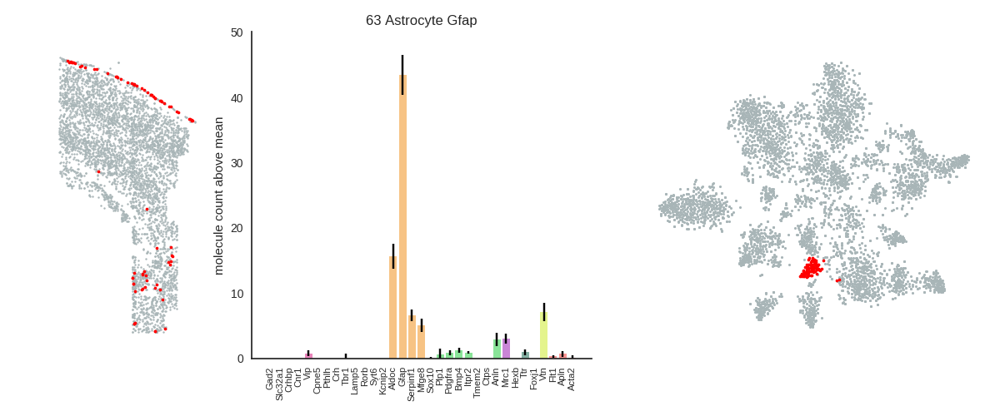

<IPython.core.display.Javascript object>


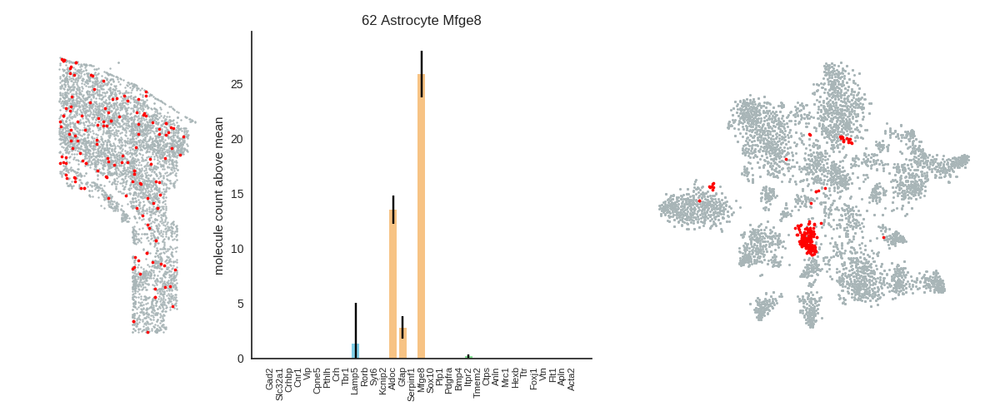

<IPython.core.display.Javascript object>


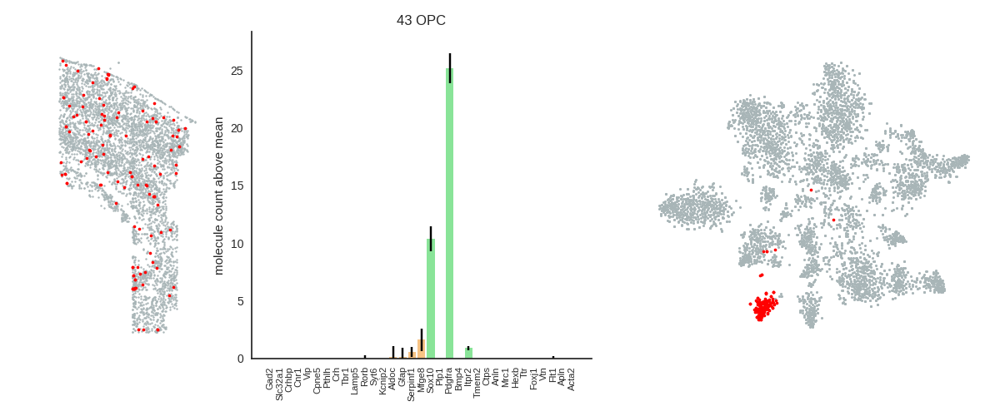

<IPython.core.display.Javascript object>


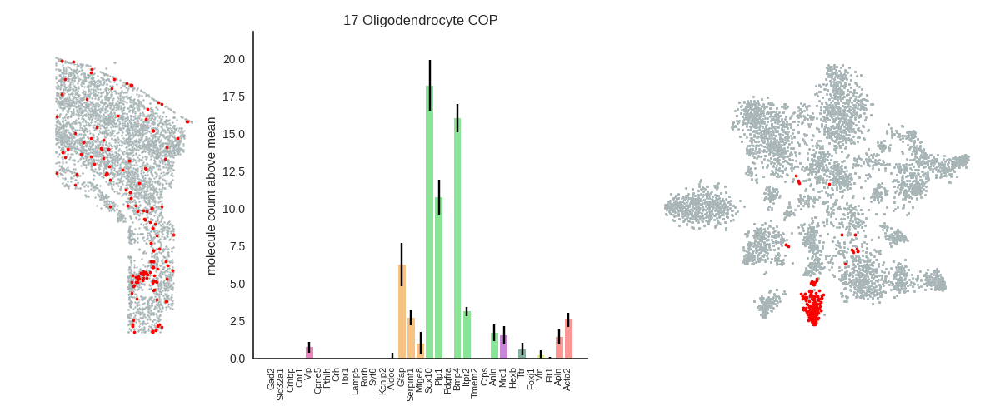

<IPython.core.display.Javascript object>


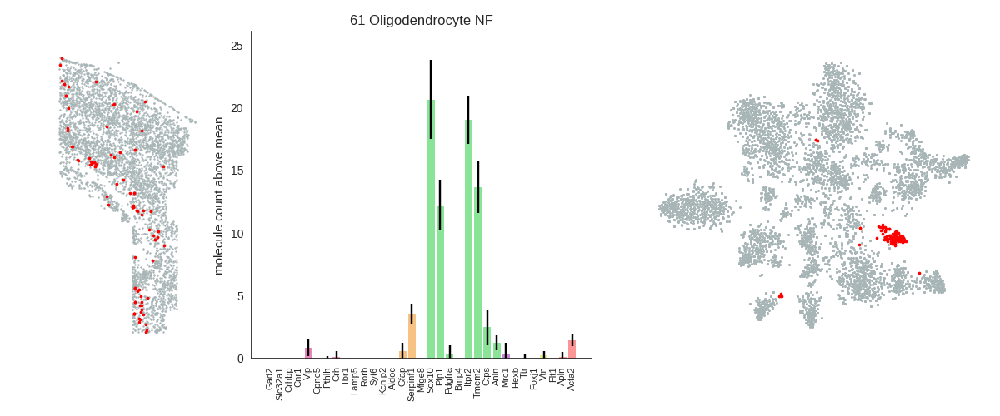

<IPython.core.display.Javascript object>


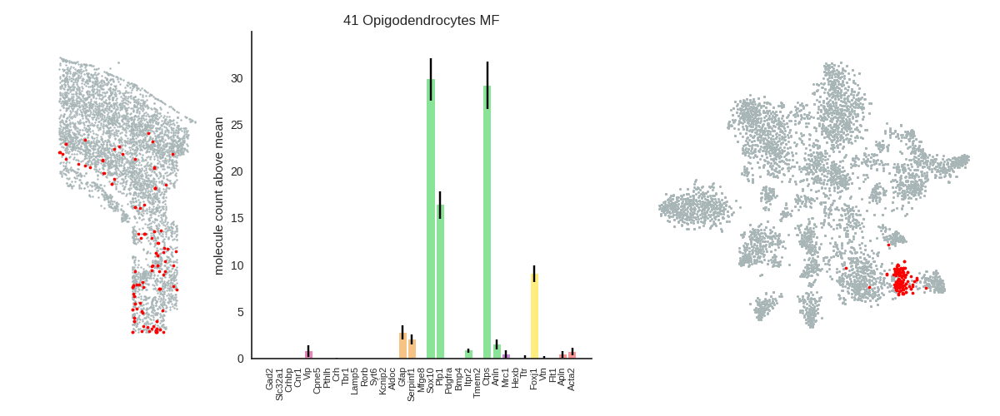

<IPython.core.display.Javascript object>


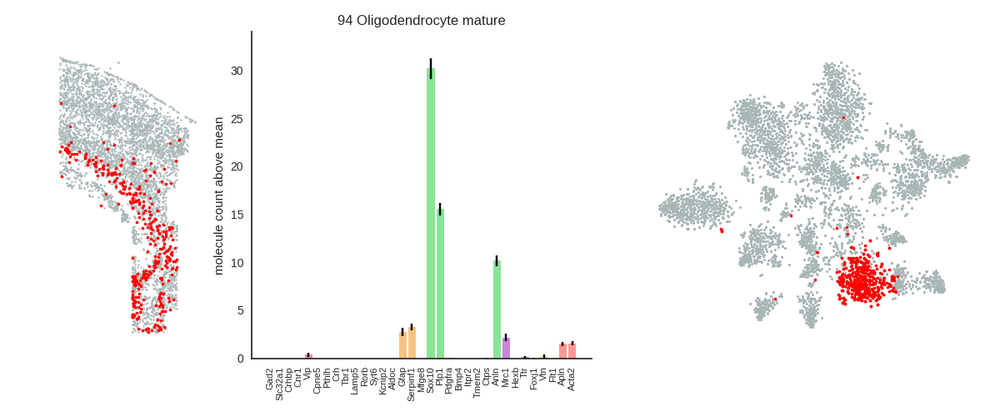

<IPython.core.display.Javascript object>


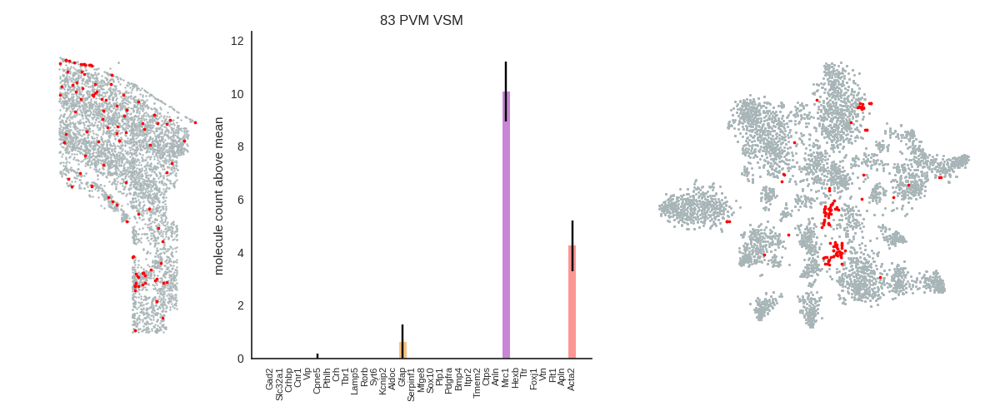

<IPython.core.display.Javascript object>


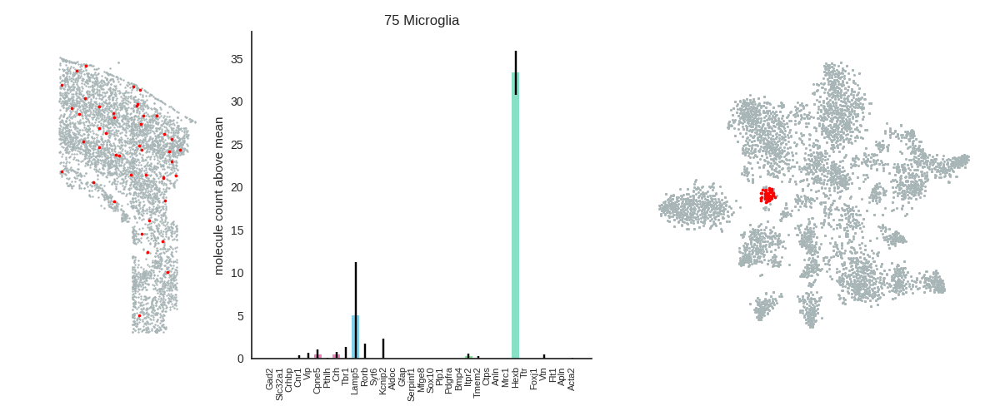

<IPython.core.display.Javascript object>


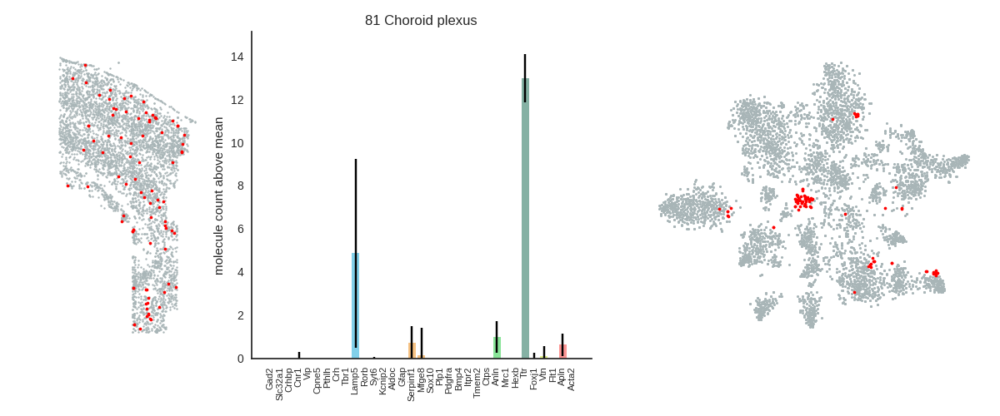

<IPython.core.display.Javascript object>


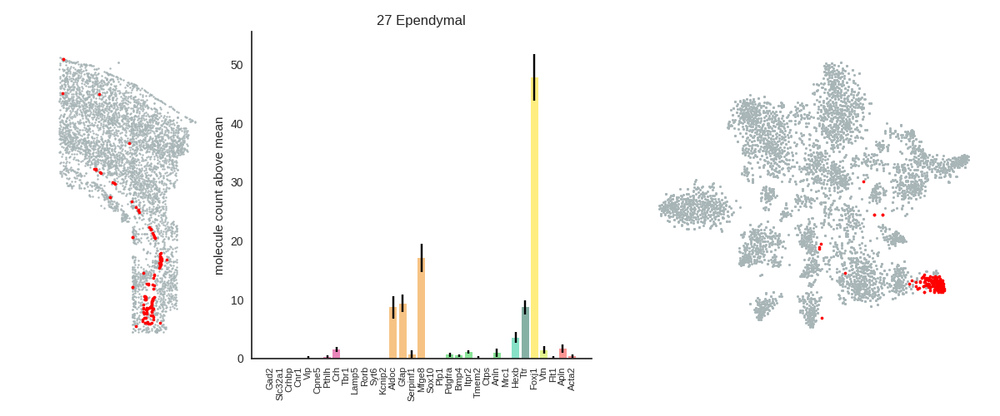

<IPython.core.display.Javascript object>


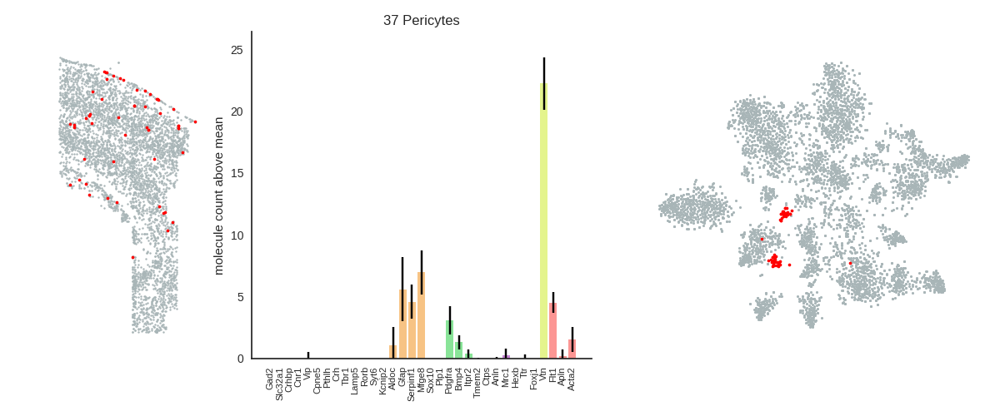

<IPython.core.display.Javascript object>


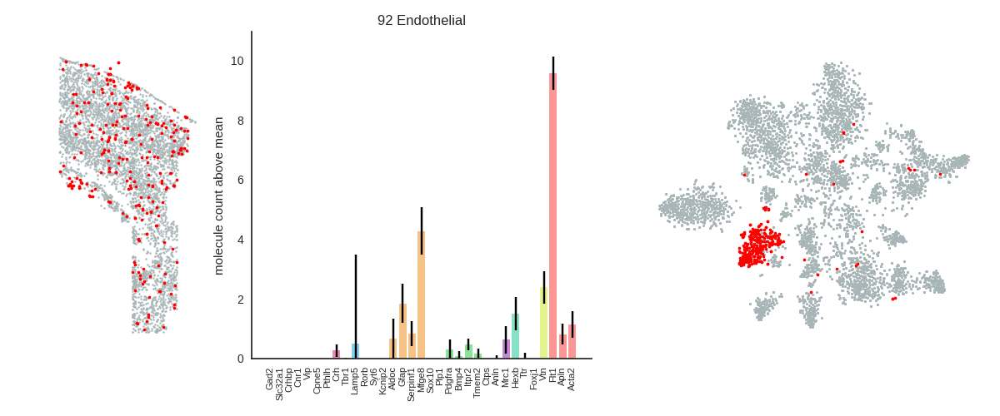

<IPython.core.display.Javascript object>


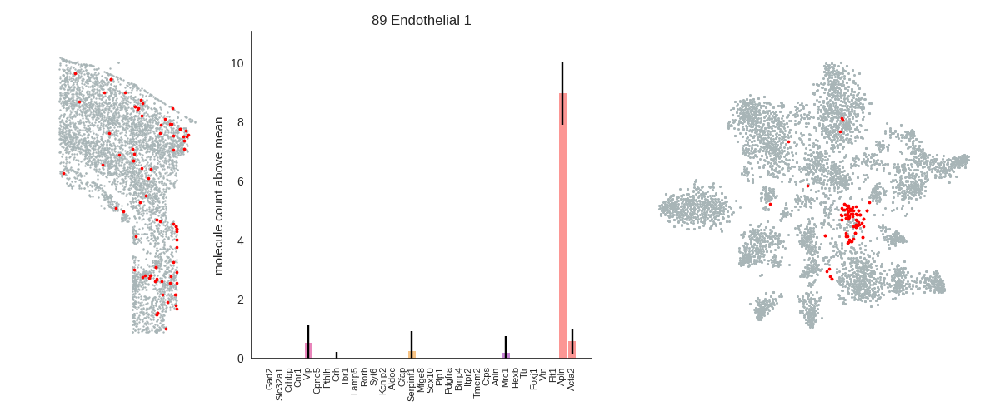

<IPython.core.display.Javascript object>


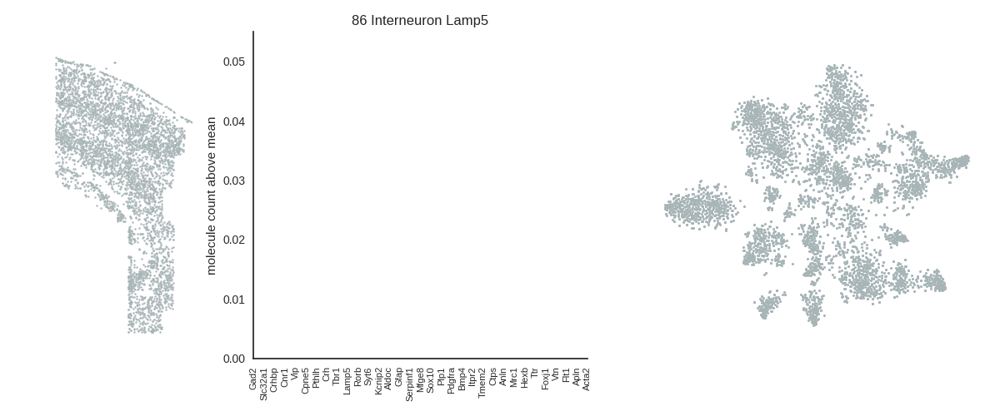

<IPython.core.display.Javascript object>


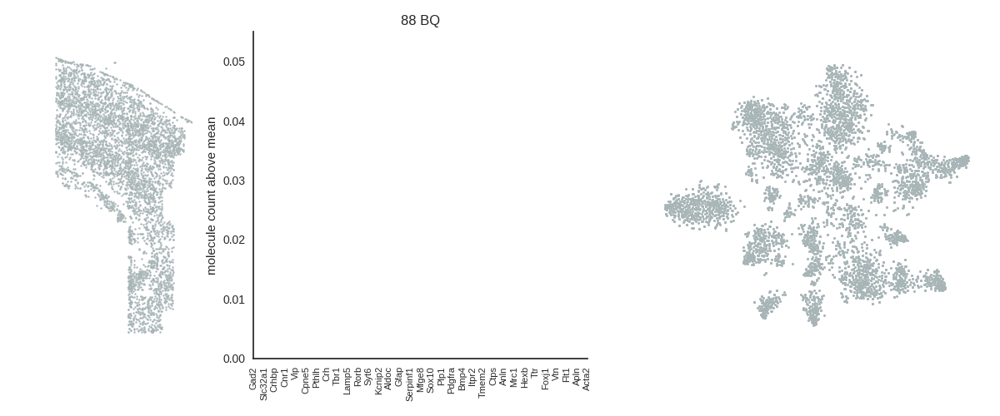

In [2018]:
def plot_clusters(df, df_tSNE, labels, clusters=None):

    #for i in np.unique(labels): 
    coord = coord_df.loc[:,df.columns]
    for i in clusters:
        fig = plt.figure(figsize=(12,5))

        ax1 = plt.subplot2grid((1,5), (0,0), rowspan=1, colspan=1)
        ax1.scatter(coord_df.loc['X',df.columns], coord_df.loc['Y',df.columns], linewidths=0, c=[168/255, 181/255, 183/255],  s=3)
        filt = labels == i
        ax1.scatter(coord.loc['X',filt], coord.loc['Y',filt], linewidths=0, c='red', s=7)
        ax1.invert_xaxis()
        ax1.invert_yaxis()
        ax1.set_axis_off()
        ax1.axis('equal')
        ax1.set_xlim([coord_df.loc['X', df.columns].max(), coord_df.loc['X',df.columns].min()])
        ax1.set_ylim([coord_df.loc['Y', df.columns].max(), coord_df.loc['Y', df.columns].min()])

        data = df_fish.loc[:,df.columns]
        data = data.loc[:,filt]
        gene_colors =   ['#d40d79', '#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79','#d40d79',
        '#07a2d5','#07a2d5','#07a2d5','#07a2d5','#07a2d5',
        '#f1880b','#f1880b','#f1880b','#f1880b',
        '#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33','#15cb33',
        '#950cae', '#11c48f',
        '#0c644a', '#ffde00',
        '#cbeb1c', '#fa2e2b', '#fa2e2b', '#fa2e2b']

        '''['red', 'red', 'red', 'red', 'red', 'red', 'red', 'red', 'red','blue', 'blue', 'blue', 'blue','orange', 'orange', 'orange', 'orange',
            'green', 'green', 'green', 'green', 'green',  'green', 'green', 'green', 'green',
            'lightblue', 'lightblue', 'darkblue', 'orange','darkred','red','lightgreen','red']'''
        left_pos = range(data.shape[0])

        ax2 = plt.subplot2grid((1,5), (0,1), rowspan=1, colspan=2)
        exp_to_plot = (data.mean(axis=1) - df_fish.mean(axis=1))
        ax2.bar(left_pos, exp_to_plot, color=gene_colors, alpha=0.5, yerr=data.sem(axis=1)) 
        x_lab = [i.split('_')[1] for i in list(df_fish_totmol.index)]
        ax2.set_xticks(left_pos)
        ax2.set_xticklabels(x_lab, rotation='vertical', fontsize=8)
        ax2.set_ylim(0)
        ax2.spines['right'].set_visible(False)
        ax2.spines['top'].set_visible(False)
        ax2.yaxis.set_ticks_position('left')
        ax2.xaxis.set_ticks_position('bottom')
        ax2.set_ylabel('molecule count above mean')
        plt.title('{} {}'.format(i, cluster_names[i]))

        ax3 = plt.subplot2grid((1,5), (0,3), rowspan=1, colspan=2)
        ax3.scatter(df_tSNE.loc['tSNE1'], df_tSNE.loc['tSNE2'], c=[168/255, 181/255, 183/255], lw=0, s=5)
        #points_of_cluster = tSNE_points[labels_a == i]
        plt.scatter(df_tSNE.loc['tSNE1', filt], df_tSNE.loc['tSNE2', filt],c='red', lw=0, alpha=1, s=7)
        ax3.set_axis_off()
        ax3.axis('equal')

        plt.tight_layout()
        plt.savefig('Clusters/{}_{}.png'.format(i, cluster_names[i]), dpi=300)
        
plot_clusters(df_fish_totmol_clean, df_tSNE_points_clean, labels_a, clusters=[66,68,69,93,78,85,47,73,87,55,54,45,21,13,90,91,79,63,62,43,17,61,41,94,83,75,81,27,37,92,89, 86,88])        
#[66,68,69,93,78,85,47,73,87,55,54,45,21,13,90,91,79,63,62,43,17,61,41,94,83,75,81,27,37,92,89, 86,88]

# Cluster comparison

In [2068]:
df_fish_mean = mean_expression(df_fish_totmol_clean.loc[:,df_fish_totmol_clean.columns], labels_a)
df_fish_mean = df_fish_mean.loc[gene_sort_fish]

In [2072]:
#make list and array of cell type labels
sc_CO_labels = []
for i in df_CO_totmol.columns:
    sc_CO_labels.append(sc_cort_olig_label[i])
sc_CO_labels_a = np.array(sc_CO_labels)

df_sc_mean = mean_expression(df_CO_totmol, sc_CO_labels_a)
df_sc_mean = df_sc_mean.loc[gene_sort]

In [2073]:
cluster_sort = [66,68,69,93,78,85,47,73,
              54,21,55,90,13,87,91,45,79,  
              63,62,
              43,17,61,41,94,
              83,75,
              81,27,
              37,92,89]

df_type_correlation = pd.DataFrame(data=np.zeros((len(cluster_sort),len(df_sc_mean.columns))), columns=type_sort_sc_cort, index=cluster_sort)
for i in df_type_correlation.index:
    df_type_correlation.loc[i] = [np.corrcoef(df_fish_mean.loc[:,i], df_sc_mean[x], )[0,1] for x in df_type_correlation.columns]

<IPython.core.display.Javascript object>


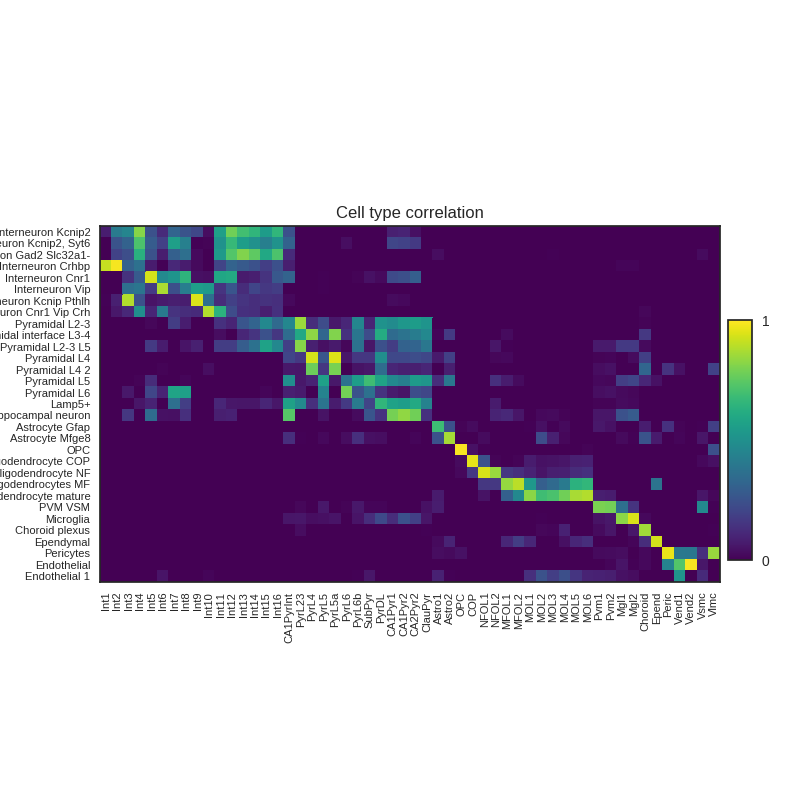

In [2074]:
#Full correlation map

fig, ax = plt.subplots(figsize=(8,8))

corr_max = np.max(df_type_correlation.max(axis=0))
im = ax.pcolor(df_type_correlation, cmap='viridis', vmin=0, vmax=1)


y_pos = np.arange(len(df_type_correlation.index))
x_pos = np.arange(len(df_type_correlation.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names[i] for i in df_type_correlation.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Cell type correlation')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df_type_correlation.index)))
ax.set_xlim((0,len(df_type_correlation.columns)))
ax.invert_yaxis()
#plt.tight_layout()

plt.savefig('Cell_type_correlation_totmol_Pearson.svg')

<IPython.core.display.Javascript object>


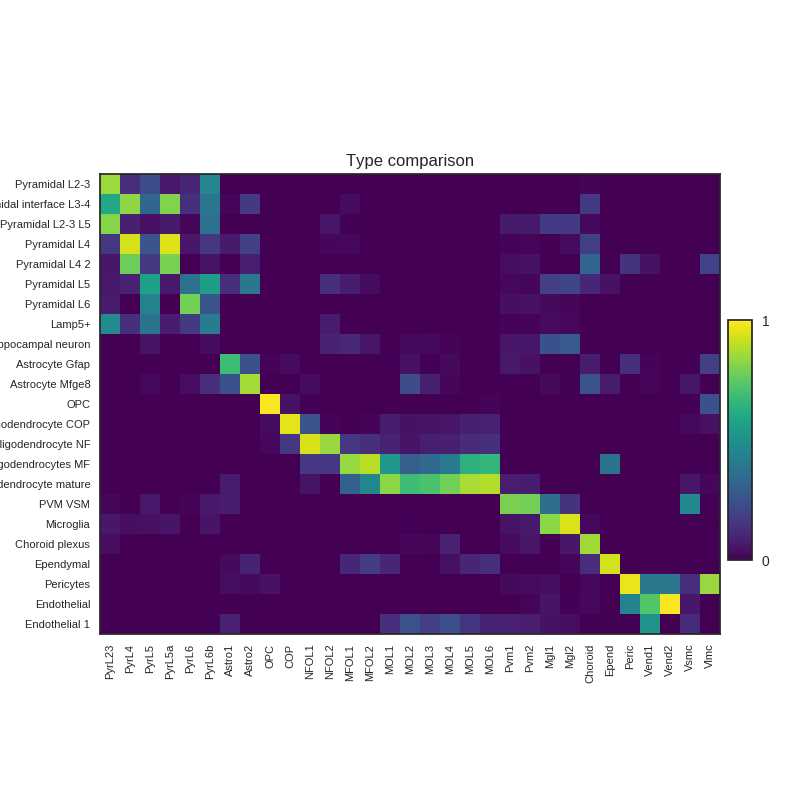

In [2092]:
#Figure (Excluding interneurons and hippocampal)

fig, ax = plt.subplots(figsize=(8,8))

type_sort_sc_cort_trimmed = ['S1PyrL23', 'S1PyrL4', 'S1PyrL5', 'S1PyrL5a', 'S1PyrL6', 'S1PyrL6b',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'PPR']

type_sort_sc_cort_trimmed_corrected= ['PyrL23', 'PyrL4', 'PyrL5', 'PyrL5a', 'PyrL6', 'PyrL6b',
'Astro1', 'Astro2',
'OPC', 'COP', 'NFOL1', 'NFOL2', 'MFOL1',
'MFOL2', 'MOL1', 'MOL2', 'MOL3', 'MOL4', 'MOL5', 'MOL6', 
'Pvm1', 'Pvm2',
'Mgl1', 'Mgl2',
'Choroid', 'Epend',
'Peric', 'Vend1', 'Vend2',
'Vsmc',
'Vlmc']

type_sort_fish_trimmed = [54,21,55,90,13,87,91,45,79,  
              63,62,
              43,17,61,41,94,
              83,75,
              81,27,
              37,92,89]

df = df_type_correlation.loc[type_sort_fish_trimmed, type_sort_sc_cort_trimmed]

im = ax.pcolor(df, cmap='viridis', vmin=0, vmax=1)

y_pos = np.arange(len(df.index))
x_pos = np.arange(len(df.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_trimmed_corrected, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names[i] for i in df.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Type comparison')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df.index)))
ax.set_xlim((0,len(df.columns)))
ax.invert_yaxis()
#plt.tight_layout()

#plt.savefig('Cell_type_correlation_Figure_totmol_Pearson.svg')

In [2094]:
for i in type_sort_sc_cort_trimmed_corrected:
    print(i)

PyrL23
PyrL4
PyrL5
PyrL5a
PyrL6
PyrL6b
Astro1
Astro2
OPC
COP
NFOL1
NFOL2
MFOL1
MFOL2
MOL1
MOL2
MOL3
MOL4
MOL5
MOL6
Pvm1
Pvm2
Mgl1
Mgl2
Choroid
Epend
Peric
Vend1
Vend2
Vsmc
Vlmc


<IPython.core.display.Javascript object>


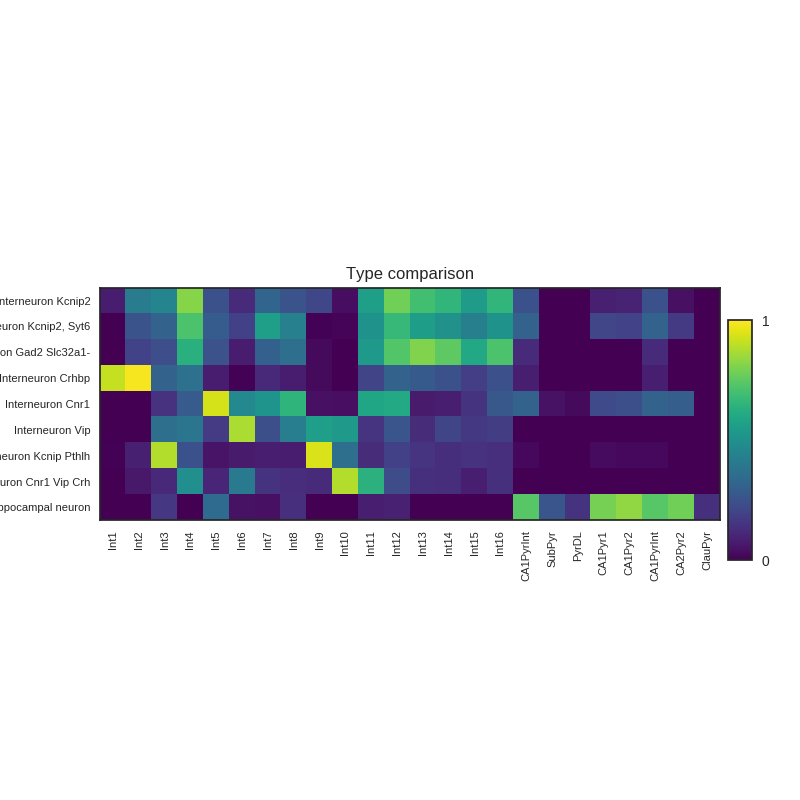

In [2077]:
#Supplemental (Interneurons)

fig, ax = plt.subplots(figsize=(8,8))

type_sort_sc_cort_trimmed2 = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',

'SubPyr', 'S1PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA1PyrInt', 'CA2Pyr2','ClauPyr',
]

type_sort_sc_cort_corrected_trimmed2 = ['Int1', 'Int2', 'Int3', 'Int4', 'Int5', 'Int6', 'Int7', 'Int8', 'Int9',
'Int10', 'Int11', 'Int12', 'Int13', 'Int14', 'Int15', 'Int16', 'CA1PyrInt',
'SubPyr', 'PyrDL', 'CA1Pyr1', 'CA1Pyr2', 'CA1PyrInt', 'CA2Pyr2','ClauPyr',]



type_sort_fish_trimmed2 = [66,68,69,93,78,85,47,73,
              79]

df = df_type_correlation.loc[type_sort_fish_trimmed2, type_sort_sc_cort_trimmed2]

im = ax.pcolor(df, cmap='viridis', vmin=0, vmax=1)

y_pos = np.arange(len(df.index))
x_pos = np.arange(len(df.columns))
ax.set_xticks(x_pos+0.5)
ax.set_xticklabels(type_sort_sc_cort_corrected_trimmed2, rotation='vertical', fontsize=8)
ax.set_yticks(y_pos+0.5)
#ax.set_yticklabels(df_type_correlation.index, fontsize=6)
ax.set_yticklabels([cluster_names[i] for i in df.index], fontsize=8)

ax.set_aspect('equal')
ax.set_title('Type comparison')
cax = fig.add_axes([.91, 0.30, 0.03, 0.3])
colorbar = fig.colorbar(im, cax=cax, ticks=[0,1])
colorbar.set_ticklabels(['0', '1'])
ax.set_ylim((0,len(df.index)))
ax.set_xlim((0,len(df.columns)))
ax.invert_yaxis()
#plt.tight_layout()

plt.savefig('Cell_type_correlation_Supplemental_totmol_Pearson.svg')

# Tissue Regions

In [2095]:
cell_labels_regions = pickle.load(open('cell_label_region.p', 'rb'))

def plot_area_content(ax, cell_labels_regions, area_of_interest, type_color, percentage_show):
    #Get cells into a dictionary per region
    """region_cells = {}
    for i in np.unique(tissue_pattern):
        region_cells[i] = []
    for c in cell_grid.columns:
        reg = tissue_pattern[cell_grid[c]['Y']-1, cell_grid[c]['X']-1]
        region_cells[reg].append(c)"""

    region_cells = {}
    for l in np.unique(list(cell_labels_regions.values())):
        region_cells[l] = []

    for k,v in cell_labels_regions.items():
        region_cells[v].append(k)

    #substitute the cells for their cell label
    region_types = {}
    for k in region_cells:
        region_types[k] =[cell_labels[i] for i in region_cells[k]]
        
    region = region_types[area_of_interest]
    c = Counter(region)
    print(c)
    percentage = np.array([(i, c[i] / len(region) * 100.0) for i in c])

    type_color_list = [type_color[i] for i in percentage[:,0]]
    #for n, i in enumerate(type_color_list):
    #    type_color_list[n] = [i[0]/255, i[1]/255, i[2]/255]

    pie_labels = []
    for i in percentage:
        if i[1] > percentage_show:
            pie_labels.append(cluster_names[i[0]])
        else:
            pie_labels.append('')

    '''pie_percentage = []
    for i in percentage:
        if i[1] > 5:
            pie_percentage.append(i[1])
        else:
            pie_percentage.append('')'''

    def my_autopct(pct):
        return ('%.0f%%' % pct) if pct > percentage_show else ''
    ax.pie(percentage[:,1], colors=type_color_list, labels=pie_labels, autopct=my_autopct)
    ax.set_aspect('equal')   
    ax.set_title('{} cells'.format(len(region)))
    
    


<IPython.core.display.Javascript object>


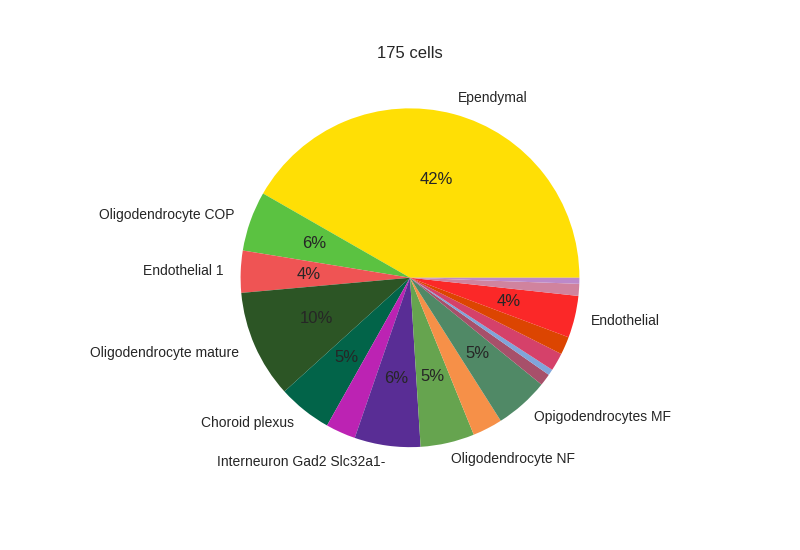

Counter({27: 73, 94: 18, 69: 11, 17: 10, 81: 9, 61: 9, 41: 9, 89: 7, 92: 7, 83: 5, 62: 5, 47: 3, 63: 3, 73: 2, 68: 2, 87: 1, 93: 1})


<IPython.core.display.Javascript object>


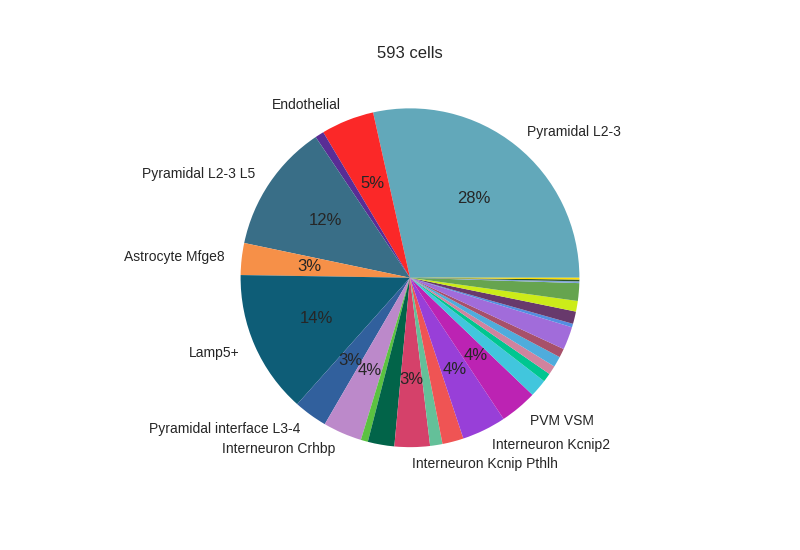

Counter({54: 169, 45: 81, 55: 73, 92: 30, 66: 25, 93: 22, 83: 21, 47: 20, 21: 19, 62: 18, 81: 15, 78: 13, 89: 12, 90: 10, 61: 10, 43: 7, 85: 7, 13: 6, 37: 6, 69: 5, 75: 5, 68: 5, 73: 5, 17: 4, 91: 2, 87: 1, 94: 1, 27: 1})


<IPython.core.display.Javascript object>


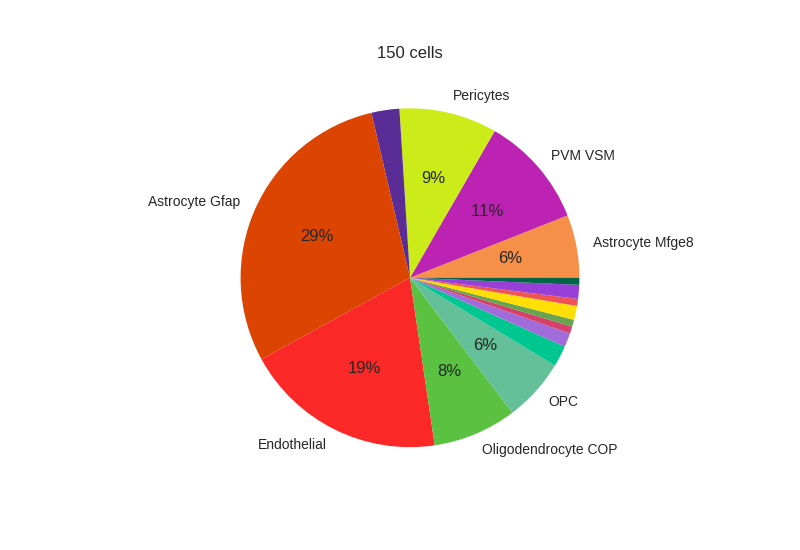

Counter({63: 44, 92: 29, 83: 16, 37: 14, 17: 12, 62: 9, 43: 9, 69: 4, 75: 3, 78: 2, 27: 2, 66: 2, 47: 1, 61: 1, 89: 1, 81: 1})


<IPython.core.display.Javascript object>


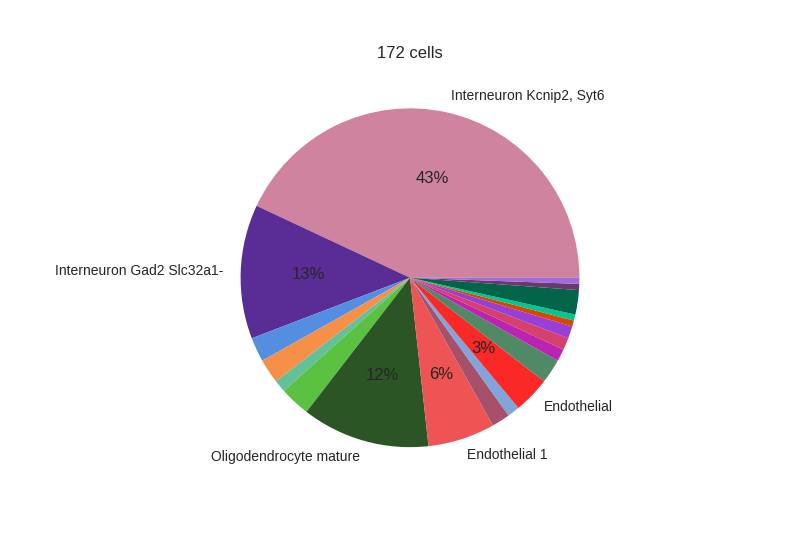

Counter({68: 74, 69: 22, 94: 21, 89: 11, 92: 6, 17: 5, 91: 4, 62: 4, 41: 4, 81: 4, 73: 3, 43: 2, 87: 2, 83: 2, 47: 2, 66: 2, 63: 1, 75: 1, 85: 1, 78: 1})


<IPython.core.display.Javascript object>


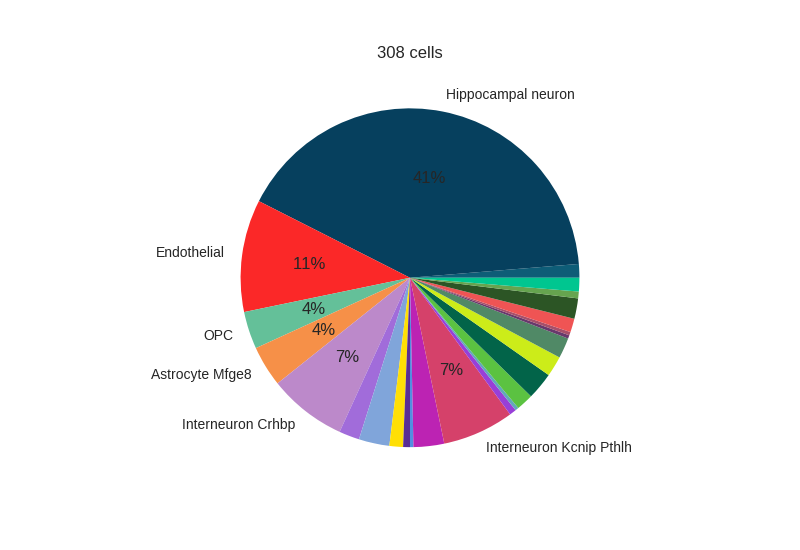

Counter({79: 127, 92: 33, 93: 23, 47: 21, 62: 12, 43: 11, 87: 9, 83: 9, 81: 8, 78: 6, 37: 6, 41: 6, 94: 6, 17: 5, 45: 4, 27: 4, 89: 4, 75: 4, 69: 2, 66: 2, 61: 2, 91: 1, 54: 1, 85: 1, 73: 1})


<IPython.core.display.Javascript object>


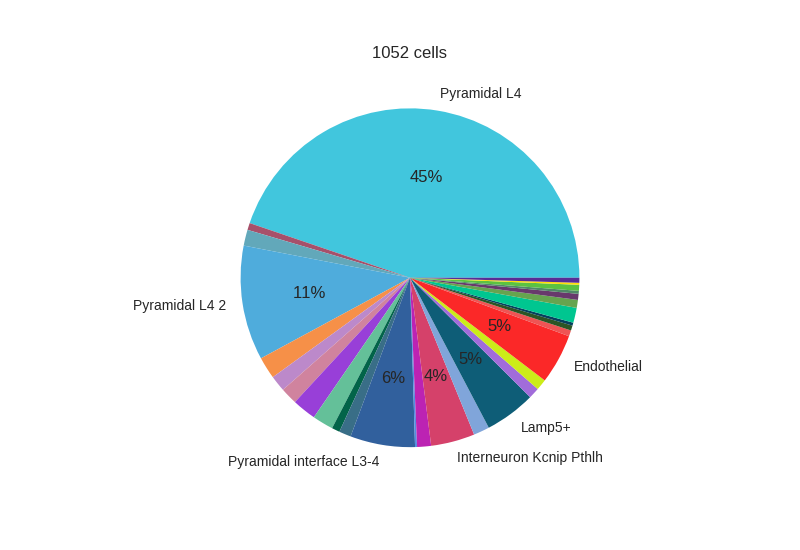

Counter({90: 471, 13: 115, 21: 65, 45: 51, 92: 50, 47: 44, 66: 24, 62: 22, 43: 21, 68: 17, 54: 16, 93: 16, 87: 16, 75: 15, 83: 14, 55: 12, 78: 11, 37: 11, 81: 8, 61: 8, 73: 7, 89: 6, 85: 6, 17: 6, 94: 5, 69: 5, 79: 3, 41: 3, 91: 2, 27: 2})


<IPython.core.display.Javascript object>


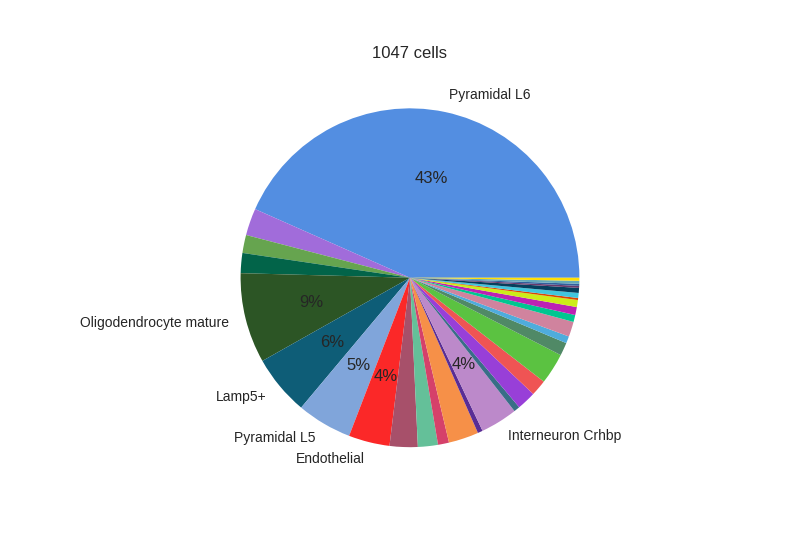

Counter({91: 454, 94: 90, 45: 60, 87: 55, 92: 41, 93: 37, 17: 31, 62: 30, 73: 28, 78: 27, 81: 20, 43: 20, 66: 19, 61: 18, 89: 16, 68: 15, 41: 13, 47: 11, 83: 8, 13: 7, 75: 7, 37: 7, 55: 6, 69: 5, 90: 5, 79: 5, 54: 3, 27: 3, 63: 2, 85: 2, 21: 2})


<IPython.core.display.Javascript object>


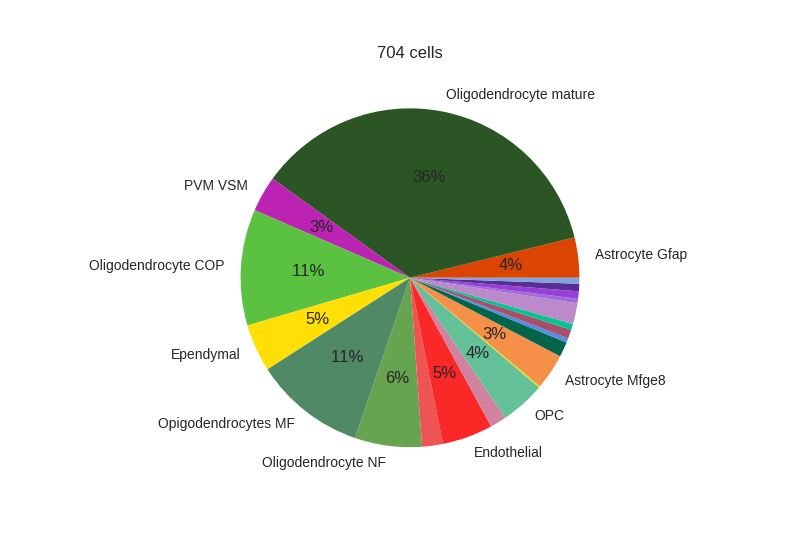

Counter({94: 255, 17: 78, 41: 75, 61: 45, 92: 34, 27: 32, 43: 30, 63: 27, 83: 24, 62: 24, 89: 14, 93: 14, 68: 11, 81: 10, 73: 6, 66: 5, 69: 5, 75: 4, 87: 4, 91: 3, 78: 3, 37: 1})


<IPython.core.display.Javascript object>


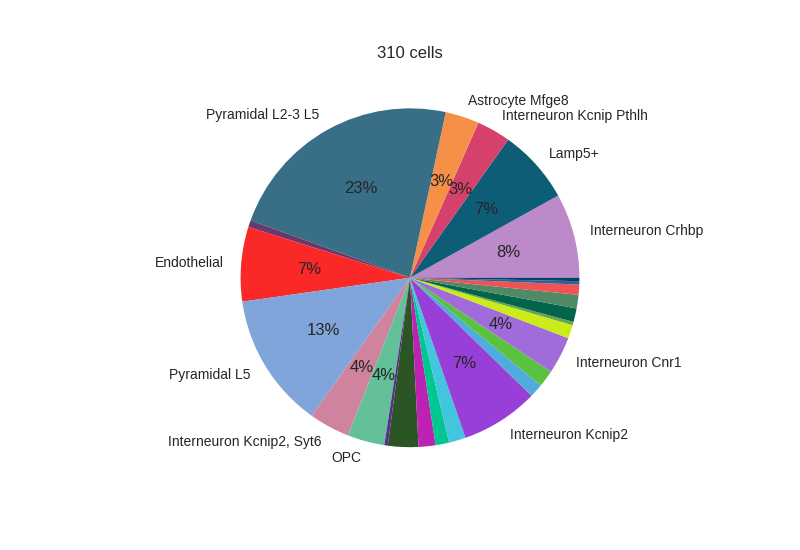

Counter({55: 71, 87: 40, 93: 25, 66: 23, 45: 22, 92: 22, 68: 12, 43: 11, 78: 11, 47: 10, 62: 10, 94: 9, 83: 5, 90: 5, 17: 5, 75: 4, 13: 4, 37: 4, 81: 4, 41: 4, 89: 3, 85: 2, 69: 1, 61: 1, 21: 1, 79: 1})


<IPython.core.display.Javascript object>


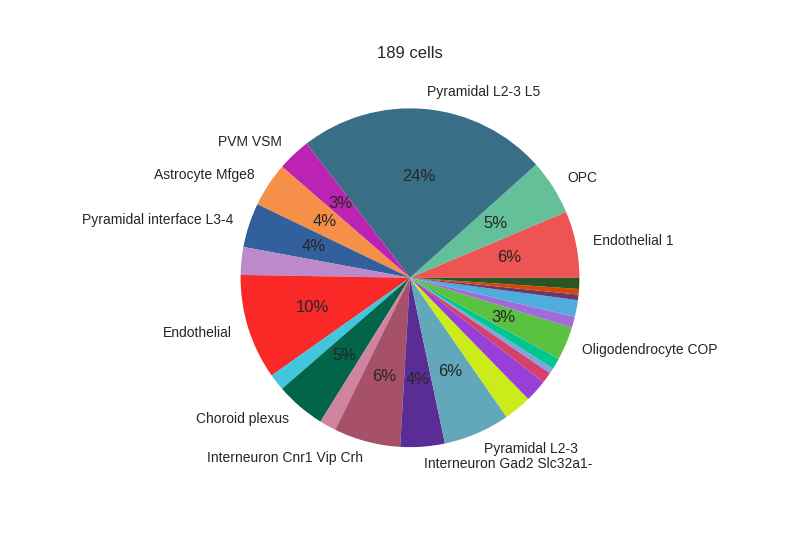

Counter({55: 45, 92: 19, 89: 12, 73: 12, 54: 12, 43: 10, 81: 9, 62: 8, 21: 8, 69: 8, 83: 6, 17: 6, 93: 5, 37: 5, 66: 4, 90: 3, 68: 3, 13: 3, 47: 2, 75: 2, 78: 2, 94: 2, 87: 1, 85: 1, 63: 1})


In [2131]:
for i in np.unique(list(cell_labels_regions.values())):
    fig, ax = plt.subplots()
    plot_area_content(ax, cell_labels_regions, i, cluster_colors, percentage_show=3)
    plt.savefig('tissue_region_content/region_{}.png'.format(i), dpi=300)

In [ ]:
fig = plt.figure(figsize=(15,20))
size_r = math.ceil(len(np.unique(tissue_pattern))/2)

for n, i in enumerate(np.unique(tissue_pattern)): #enumerate([5,2,3,1,4,6,0,7]):
    axl = plt.subplot2grid((size_r, 4), (int(n/2), (n%2)*2), rowspan=1, colspan=1)
    plot_contour(axl, tissue_pattern, area_of_interest=int(i))
    axl.set_title('Area {} number{}'.format(n, i))
    axl.axis('off')
    axr = plt.subplot2grid((size_r, 4), (int(n/2),((n%2)*2)+1), rowspan=1, colspan=1)
    plot_area_content(axr, tissue_pattern, area_of_interest=int(i), type_color_list=type_color_list)
plt.tight_layout()